# Sample Data
- https://zenodo.org/records/376839

- https://getliner.com/search/s/1194595/t/66632387
- https://getliner.com/search/s/1194595/t/68639406
- https://getliner.com/search/s/1194595/t/69309064

# Modified Task
- https://getliner.com/search/s/1194595/t/69622660
- https://chatgpt.com/c/671bf05c-ad84-8004-ae8e-2d32b866beea

# Successful Codes
- First Trial: https://www.kaggle.com/code/darisdzakwanhoesien2/fork-of-oulu-nlp-progress?scriptVersionId=202753303
- Second Complete Attempt

Project 32: Topic Modeling and Emotion Trend Analysis in Parliamentary Speeches

- The main goal of this project is to explore themes in UK parliamentary speeches over time, analyze emotional patterns in discussions, and identify differences in topic focus across political parties, speakers, and government roles. The dataset contains detailed speech data, including various sentiment scores and metadata such as speaker information, gender, party affiliation, and speech date. This project will leverage advanced NLP techniques, topic modeling, and sentiment analysis to understand the nuances of emotional expression and thematic trends in parliamentary discourse.
1. Text Preprocessing: Perform standard text preprocessing tasks on the speech column, including removing stop words, punctuation, and special characters. Convert all text to lowercase, tokenize the speeches, and apply stemming or lemmatization to normalize the content.
2. Initial Data Exploration: Explore the distribution of key features, including speech_date, year, gender, party_group, ministry, and government. Visualize these distributions to gain insights into how speech data varies across different political and demographic contexts.
3. Speech Word Frequency and N-Gram Analysis: Define a function to calculate the average sentiment score for each speech based on various sentiment metrics (afinn_sentiment, bing_sentiment, nrc_sentiment, sentiword_sentiment, hu_sentiment). Categorize all speeches into sentiment categories (e.g., Strongly Negative, Moderately Negative, Neutral, Moderately Positive, Strongly Positive), and identify the most frequent words for each category. Visualize these words using word clouds and bar charts, with separate visualizations for each sentiment category.
4. Cross-Category Analysis: Repeat the word frequency and n-gram analysis for different features such as party_group, ministry, and government to identify patterns across political affiliations and demographic groups.
5. Demographic-Based Speech Similarity Calculation: Propose a method for calculating the similarity between speeches by considering demographic characteristics of the speakers, including date_of_birth, gender, party, age, party_group, ministry, and government. Use these similarities to explore how demographic factors influence speech content.
6. Speech Text-Based Speech Similarity Calculation: Develop methods for calculating speech similarity based on textual content, including TF-IDF, Semantic Similarity, and Doc2Vec. Use these methods to analyze the thematic relationships between speeches based on their textual content.
7. Speech Clustering: Using the speech similarities calculated in Tasks 5 and 6, apply suitable clustering algorithms (e.g., K-Means, DBSCAN, or Agglomerative Clustering) to group similar speeches. Perform the clustering separately for demographic data and text data, then compare and discuss the clustering outcomes.
8. Cluster Analysis: For each of the identified speech clusters, find the average sentiment score, most frequent words, and topics using suitable topic modeling techniques (e.g., LDA, LSA). Visualize the results to identify interesting patterns or trends related to speech clusters. Discuss significant insights, such as clusters that show strong positive or negative sentiment trends and highlight notable patterns focus and sentiment expression.
9. Correlation Between Features and Sentiment: Calculate correlations between various features (speech_date, year, gender, party_group, ministry, government) and sentiment scores (e.g., afinn_sentiment, nrc_sentiment). Analyze whether specific attributes (e.g., a particular party or ministry) are more likely to convey positive or negative sentiment. Visualize these findings using distribution plots to explore potential patterns.
10. Topic Evolution Over Time: Track how topics evolve over time by leveraging Dynamic Topic Modeling (LDA) and BERTopic’s time-based analysis. Visualize topic trends across different periods (e.g., by year or government term) to study shifts in policy focus and emotional expression. Additionally, analyze and visualize how topics are distributed across different political parties, speakers (proper_name), and ministries. Use topic distributions to reveal trends in political discourse, differences in focus, and variations in how topics are addressed by different government sectors.
11. Named Entity Recognition (NER) for Speaker and Content Analysis: Apply Named Entity Recognition (NER) to the speech text to identify and categorize key entities such as persons, organizations, locations, dates, and policy-related terms. The goal is to understand how specific entities are referenced across different speeches and how they relate to the sentiment expressed.
- (a) Identify the most frequently mentioned entities and analyze how often certain entities (e.g., key political figures, organizations, or policy terms) appear in positive or negative contexts.
- (b) Examine co-occurrence patterns between entities to detect associations (e.g., politicians frequently mentioned alongside specific policies or issues). Visualize these associations using network graphs to reveal relationships and alliances within the discourse.
- (c) Cross-Feature Analysis: Explore how named entities are distributed across different features such as party_group, ministry and gender and analyze whether certain entities are predominantly mentioned by specific parties or ministries and how these mentions correlate with sentiment trends.
12. Emotion Prediction Using Extracted Features:
- (a) Demographic Features Only: Design a machine learning model to predict the average sentiment score of each speech based only on demographic features (e.g., gender, party_group, age). Categorize the sentiment into bins (e.g., Strongly Negative, Moderately Negative, Neutral, Moderately Positive, Strongly Positive). Apply traditional and deep learning-based models and compare the results.
- (b) Text Features Only: Convert the speech text into numerical representations suitable for machine learning models using word embeddings like Word2Vec, GloVe, or BERT. Build an emotion classification model to predict the sentiment based on the extracted features and sentiment scores.
- (c) Combined Features: Use both demographic features and speech text for sentiment prediction. Compare the results of different approaches and discuss the insights.
13. Advanced NLP and LLM Techniques for Enhanced Sentiment Analysis: Explore additional NLP techniques or state-of-the-art models to improve sentiment analysis. Experiment with transformer-based models such as RoBERTa, GPT, or DistilBERT, and compare their performance to traditional word embeddings. Assess how well these models handle nuanced expressions, such as sarcasm, subtlety, and complex emotional cues within parliamentary speeches.
14. Literature Review and Analysis:Identify relevant literature to contextualize the findings from the previous tasks. Compare various feature extraction and classification techniques, highlighting their strengths and weaknesses. Discuss the effectiveness of the data processing pipeline, suggest improvements, and explore additional data sources that could enhance sentiment and topic analysis. Address limitations, such as data imbalance or the complexity of political language and propose future research directions.

In [1]:
!unzip /usr/share/nltk_data/corpora/wordnet.zip 
!pip install umap-learn
!pip install hdbscan
!pip install bertopic
!pip install sentence-transformers
!pip install vaderSentiment textblob
!python -m textblob.download_corpora

Archive:  /usr/share/nltk_data/corpora/wordnet.zip
   creating: wordnet/
  inflating: wordnet/lexnames        
  inflating: wordnet/data.verb       
  inflating: wordnet/index.adv       
  inflating: wordnet/adv.exc         
  inflating: wordnet/index.verb      
  inflating: wordnet/cntlist.rev     
  inflating: wordnet/data.adj        
  inflating: wordnet/index.adj       
  inflating: wordnet/LICENSE         
  inflating: wordnet/citation.bib    
  inflating: wordnet/noun.exc        
  inflating: wordnet/verb.exc        
  inflating: wordnet/README          
  inflating: wordnet/index.sense     
  inflating: wordnet/data.noun       
  inflating: wordnet/data.adv        
  inflating: wordnet/index.noun      
  inflating: wordnet/adj.exc         
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 58.5 MB/s eta 0:00:00
   ━━━━━━━

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer, WordNetLemmatizer
from tqdm import tqdm

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering

# Ensure nltk data is downloaded (stopwords, punkt, wordnet)
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('punkt_tab')

[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt_tab to /usr/share/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

# 1- Text Preprocessing: 
- Perform standard text preprocessing tasks on the speech column, including removing stop words, punctuation, and special characters. Convert all text to lowercase, tokenize the speeches, and apply stemming or lemmatization to normalize the content.

In [3]:
stats_summary = pd.read_csv('/kaggle/input/hansard-dataset/summary_stats.csv', index_col='Unnamed: 0') # /kaggle/input/oulu-university/summary_stats.csv
stats_summary

,eo_id,afinn_sentiment,afinn_sd,jockers_sentiment,jockers_sd,nrc_sentiment,nrc_sd,huliu_sentiment,huliu_sd,rheault_sentiment,...,url,person_id,hansard_membership_id,mnis_id,dods_id,pims_id,speaker_office,age,speaker_id,processed_column
count,2.230357e+06,2.230357e+06,1.893672e+06,2.230357e+06,1.893672e+06,2.230357e+06,1.893672e+06,2.230357e+06,1.893672e+06,2.230357e+06,...,0.0,128973.000000,1.256322e+06,2.230357e+06,2.230357e+06,2.230357e+06,0.0,2.230357e+06,1.101382e+06,2.230357e+06
mean,1.115198e+06,1.682544e-01,5.236760e-01,1.290766e-01,2.450211e-01,1.759086e-01,3.417740e-01,6.289320e-02,3.092717e-01,2.191952e-01,...,NaN,17598.324804,4.512963e+03,9.304214e+02,2.229632e+04,2.448626e+03,NaN,5.104716e+01,1.716193e+04,4.655410e-01
std,6.438600e+05,6.612349e-01,9.201066e-01,1.840158e-01,1.382440e-01,2.589687e-01,2.107249e-01,4.158641e-01,3.161838e-01,3.671582e-01,...,NaN,7073.286455,3.485805e+03,1.014140e+03,1.855904e+04,1.935754e+03,NaN,9.110780e+00,1.737798e+04,1.283799e+02
min,1.000000e+00,-3.117849e+02,0.000000e+00,-1.277864e+01,0.000000e+00,-2.413610e+01,0.000000e+00,-4.777568e+01,0.000000e+00,-1.728802e+01,...,NaN,10001.000000,2.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,NaN,2.000000e+01,6.870000e+02,0.000000e+00
25%,5.575990e+05,0.000000e+00,2.540003e-01,3.185789e-03,1.620185e-01,0.000000e+00,2.238552e-01,-4.463982e-02,1.779447e-01,1.122157e-01,...,NaN,10726.000000,1.334000e+03,3.000000e+02,0.000000e+00,6.630000e+02,NaN,4.500000e+01,1.617000e+03,3.839026e-03
50%,1.115198e+06,1.200368e-01,4.588315e-01,1.220867e-01,2.349796e-01,1.809939e-01,3.245783e-01,2.217826e-02,2.836299e-01,2.058427e-01,...,NaN,11927.000000,4.042000e+03,6.230000e+02,2.551200e+04,2.334000e+03,NaN,5.100000e+01,3.284000e+03,5.649365e-02
75%,1.672797e+06,3.922323e-01,6.757584e-01,2.343231e-01,3.098390e-01,3.162278e-01,4.233164e-01,2.010957e-01,3.922323e-01,3.091607e-01,...,NaN,24932.000000,7.224000e+03,1.191000e+03,2.648400e+04,4.165000e+03,NaN,5.700000e+01,4.014200e+04,2.108189e-01
max,2.230396e+06,3.076509e+02,5.969414e+02,1.937053e+01,1.457303e+01,1.952693e+01,4.798743e+01,3.810737e+02,1.672915e+02,4.784140e+02,...,NaN,25601.000000,1.662400e+04,4.595000e+03,1.472150e+05,6.194000e+03,NaN,8.500000e+01,4.070500e+04,9.720980e+04


In [4]:
stats_summary['afinn_sentiment']['mean']

0.1682544217432012

In [5]:
# Load the dataset
sample = pd.read_csv('/kaggle/input/hansard-dataset/Hansard Dataset/sample_2001.csv') # /kaggle/input/oulu-university/hansard_senti_post_csv_03/sample_2001.csv
sample.iloc[0]

pp_id                          uk.org.publicwhip/debate/2013-06-06b.1756.2
eo_id                                                              2000035
speech                   c("It is true to say that very little of what ...
afinn_sentiment                                                  -0.265684
afinn_sd                                                          3.219439
jockers_sentiment                                                 0.059695
jockers_sd                                                        0.309071
nrc_sentiment                                                     0.080234
nrc_sd                                                            0.669475
huliu_sentiment                                                  -0.060833
huliu_sd                                                          0.688664
rheault_sentiment                                                 0.210271
rheault_sd                                                        0.241488
word_count               

In [6]:
sample

,pp_id,eo_id,speech,afinn_sentiment,afinn_sd,jockers_sentiment,jockers_sd,nrc_sentiment,nrc_sd,huliu_sentiment,...,party_group,party,government,speaker_office,age,gender,date_of_birth,house_start_date,house_end_date,ministry
0,uk.org.publicwhip/debate/2013-06-06b.1756.2,2000035,"c(""It is true to say that very little of what ...",-0.265684,3.219439,0.059695,0.309071,0.080234,0.669475,-0.060833,...,Labour,Labour,Opposition,NaN,62,Male,1950-09-15,1997-05-01,NaN,Cameron1
1,uk.org.publicwhip/debate/2013-06-06b.1759.0,2000036,"c(""The debate about pollinators and pesticides...",0.055609,1.745916,0.099597,0.333835,0.322938,0.445928,0.000543,...,Labour,Labour,Opposition,NaN,48,Female,1965-03-26,2005-05-05,NaN,Cameron1
2,uk.org.publicwhip/debate/2013-06-06b.1761.0,2000037,"c(""I, too, congratulate the Chair of the Envir...",0.076618,0.892331,0.038996,0.335624,0.116778,0.437213,-0.164810,...,Labour,Labour,Opposition,NaN,56,Female,1956-12-04,2005-05-05,NaN,Cameron1
3,uk.org.publicwhip/debate/2013-06-06b.1764.0,2000038,"c(""I begin by echoing other Membersâ tribute...",0.463118,0.566264,0.191108,0.250156,0.306488,0.340074,0.136243,...,Labour,Labour,Opposition,NaN,49,Male,1964-02-20,2001-06-07,2015-03-30,Cameron1
4,uk.org.publicwhip/debate/2013-06-06b.1765.0,2000039,indicated assent.\n,0.000000,NaN,0.282843,NaN,0.707107,NaN,0.000000,...,Liberal Democrat,Liberal Democrat,Government,NaN,59,Male,1954-03-16,1997-05-01,2015-03-30,Cameron1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,uk.org.publicwhip/debate/2013-06-20b.1042.5,2001030,The potential benefits of becoming the UK city...,1.424079,NaN,0.766812,NaN,1.351049,NaN,0.365148,...,Conservative,Conservative,Government,The Parliamentary Under-Secretary of State for...,45,Male,1968-06-05,2005-05-05,NaN,Cameron1
996,uk.org.publicwhip/debate/2013-06-20b.1042.6,2001031,I am sure the Minister will be aware of early-...,0.340353,0.410994,0.067045,0.132634,0.047319,0.327509,-0.018184,...,Labour,Labour,Opposition,NaN,56,Male,1956-11-17,2005-05-05,2015-03-30,Cameron1
997,uk.org.publicwhip/debate/2013-06-20b.1042.7,2001032,"I think we will give that one a miss, because ...",-0.196907,0.703600,-0.266617,0.250847,0.000000,0.000000,-0.424061,...,Conservative,Conservative,Government,NaN,50,Male,1963-01-19,1997-05-01,NaN,Cameron1
998,uk.org.publicwhip/debate/2013-06-20b.1042.9,2001033,What her policy is on the repatriation of indi...,0.000000,NaN,0.000000,NaN,0.000000,NaN,0.000000,...,Conservative,Conservative,Government,NaN,47,Male,1966-03-17,2001-06-07,NaN,Cameron1


In [7]:
# !unzip /usr/share/nltk_data/corpora/wordnet.zip -d /usr/share/nltk_data/corpora/

In [8]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [9]:
# Initialize stop words, stemmer, and lemmatizer
stop_words = set(stopwords.words('english'))
stemmer = PorterStemmer()
lemmatizer = WordNetLemmatizer()

# Function to remove specified words
def preprocessing_remove(tokens, remove_words):
    """
    Remove specified words from a list of tokens.

    Args:
    - tokens (list of str): The list of tokens.
    - remove_words (list of str): The words to be removed from the list of tokens.

    Returns:
    - list of str: The filtered list of tokens with the specified words removed.
    """
    filtered_tokens = [token for token in tokens if token not in remove_words]
    return filtered_tokens

# Function for text preprocessing
def preprocess_text(text): # , remove_words=None
    """
    Preprocess the input text by converting it to lowercase, tokenizing,
    removing punctuation, stop words, stemming, and lemmatization.
    Additionally, removes words in the remove_words list.

    Args:
    - text (str): The input text to preprocess.
    - remove_words (list of str): Additional words to remove from the text.

    Returns:
    - list of str: The preprocessed tokens.
    """
    # Ensure text is a string
    text = str(text)
    # Convert to lowercase
    text = text.lower()
    # Tokenize
    tokens = word_tokenize(text)
    # Remove punctuation and special characters
    tokens = [word for word in tokens if word.isalnum()]
    # Remove stop words
    tokens = [word for word in tokens if word not in stop_words]
    # Apply stemming
    tokens = [stemmer.stem(word) for word in tokens]
    # Apply lemmatization
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    return tokens

# Initialize tqdm for pandas
tqdm.pandas()

# Example DataFrame
remove_words_list = ['c']

sample['speech_processed'] = sample['speech'].progress_apply(preprocess_text) # Apply preprocessing function to the 'speech' column using progress_apply
sample['len_speech_processed'] = sample['speech_processed'].progress_apply(len) # Calculate the lengths of the processed speech
sample['speech_processed_final'] = sample['speech_processed'].progress_apply(lambda x: preprocessing_remove(x, remove_words_list)) # Apply preprocessing_remove function to the 'speech_processed' column using progress_apply
sample['len_speech_processed_final'] = sample['speech_processed_final'].apply(len) # Calculate the lengths of the final processed speech
sample

100%|██████████| 1000/1000 [00:00<00:00, 64060.60it/s]


,pp_id,eo_id,speech,afinn_sentiment,afinn_sd,jockers_sentiment,jockers_sd,nrc_sentiment,nrc_sd,huliu_sentiment,...,age,gender,date_of_birth,house_start_date,house_end_date,ministry,speech_processed,len_speech_processed,speech_processed_final,len_speech_processed_final
0,uk.org.publicwhip/debate/2013-06-06b.1756.2,2000035,"c(""It is true to say that very little of what ...",-0.265684,3.219439,0.059695,0.309071,0.080234,0.669475,-0.060833,...,62,Male,1950-09-15,1997-05-01,NaN,Cameron1,"[c, true, say, littl, discus, chamber, beyond,...",566,"[true, say, littl, discus, chamber, beyond, di...",564
1,uk.org.publicwhip/debate/2013-06-06b.1759.0,2000036,"c(""The debate about pollinators and pesticides...",0.055609,1.745916,0.099597,0.333835,0.322938,0.445928,0.000543,...,48,Female,1965-03-26,2005-05-05,NaN,Cameron1,"[c, debat, pollin, pesticid, tend, seen, debat...",756,"[debat, pollin, pesticid, tend, seen, debat, b...",754
2,uk.org.publicwhip/debate/2013-06-06b.1761.0,2000037,"c(""I, too, congratulate the Chair of the Envir...",0.076618,0.892331,0.038996,0.335624,0.116778,0.437213,-0.164810,...,56,Female,1956-12-04,2005-05-05,NaN,Cameron1,"[c, congratul, chair, environment, audit, comm...",754,"[congratul, chair, environment, audit, committ...",753
3,uk.org.publicwhip/debate/2013-06-06b.1764.0,2000038,"c(""I begin by echoing other Membersâ tribute...",0.463118,0.566264,0.191108,0.250156,0.306488,0.340074,0.136243,...,49,Male,1964-02-20,2001-06-07,2015-03-30,Cameron1,"[c, begin, echo, tribut, hon, friend, member, ...",399,"[begin, echo, tribut, hon, friend, member, nor...",398
4,uk.org.publicwhip/debate/2013-06-06b.1765.0,2000039,indicated assent.\n,0.000000,NaN,0.282843,NaN,0.707107,NaN,0.000000,...,59,Male,1954-03-16,1997-05-01,2015-03-30,Cameron1,"[indic, assent]",2,"[indic, assent]",2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,uk.org.publicwhip/debate/2013-06-20b.1042.5,2001030,The potential benefits of becoming the UK city...,1.424079,NaN,0.766812,NaN,1.351049,NaN,0.365148,...,45,Male,1968-06-05,2005-05-05,NaN,Cameron1,"[potenti, benefit, becom, uk, citi, cultur, in...",18,"[potenti, benefit, becom, uk, citi, cultur, in...",18
996,uk.org.publicwhip/debate/2013-06-20b.1042.6,2001031,I am sure the Minister will be aware of early-...,0.340353,0.410994,0.067045,0.132634,0.047319,0.327509,-0.018184,...,56,Male,1956-11-17,2005-05-05,2015-03-30,Cameron1,"[sure, minist, awar, motion, 156, tabl, name, ...",32,"[sure, minist, awar, motion, 156, tabl, name, ...",32
997,uk.org.publicwhip/debate/2013-06-20b.1042.7,2001032,"I think we will give that one a miss, because ...",-0.196907,0.703600,-0.266617,0.250847,0.000000,0.000000,-0.424061,...,50,Male,1963-01-19,1997-05-01,NaN,Cameron1,"[think, give, one, miss, minist, respons, poli...",38,"[think, give, one, miss, minist, respons, poli...",38
998,uk.org.publicwhip/debate/2013-06-20b.1042.9,2001033,What her policy is on the repatriation of indi...,0.000000,NaN,0.000000,NaN,0.000000,NaN,0.000000,...,47,Male,1966-03-17,2001-06-07,NaN,Cameron1,"[polici, repatri, indigen, australian, human, ...",9,"[polici, repatri, indigen, australian, human, ...",9


In [10]:
token = sample[['eo_id','speech','len_speech_processed','len_speech_processed_final']]
token

,eo_id,speech,len_speech_processed,len_speech_processed_final
0,2000035,"c(""It is true to say that very little of what ...",566,564
1,2000036,"c(""The debate about pollinators and pesticides...",756,754
2,2000037,"c(""I, too, congratulate the Chair of the Envir...",754,753
3,2000038,"c(""I begin by echoing other Membersâ tribute...",399,398
4,2000039,indicated assent.\n,2,2
...,...,...,...,...
995,2001030,The potential benefits of becoming the UK city...,18,18
996,2001031,I am sure the Minister will be aware of early-...,32,32
997,2001032,"I think we will give that one a miss, because ...",38,38
998,2001033,What her policy is on the repatriation of indi...,9,9


# 2. Initial Data Exploration: 
- Explore the distribution of key features, including speech_date, year, gender, party_group, ministry, and government. Visualize these distributions to gain insights into how speech data varies across different political and demographic contexts.

In [11]:
def print_summary_statistics(df):
    """Print summary statistics of the dataset."""
    print("Dataset Summary:")
    print(df.describe())
    print("\nDataset Info:")
    df.info()

def plot_categorical_distribution(df, column, title):
    """Plot the distribution of a categorical variable."""
    plt.figure(figsize=(10, 6))
    sns.countplot(x=column, data=df)
    plt.title(f"Distribution of {title}")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

def plot_numerical_distribution(df, column, title):
    """Plot the distribution of a numerical variable."""
    plt.figure(figsize=(10, 6))
    sns.histplot(df[column], kde=True)
    plt.title(f"Distribution of {title}")
    plt.tight_layout()
    plt.show()

def plot_time_distribution(df):
    """Plot the distribution of speeches over time of day."""
    # Convert 'time' column to datetime.time objects
    df['time'] = pd.to_datetime(df['time'], format='%H:%M:%S', errors='coerce').dt.time
    
    # Drop rows where the time conversion failed
    df = df.dropna(subset=['time'])
    
    # Extract hour from the time
    df['hour'] = df['time'].apply(lambda x: x.hour)
    
    # Plot the distribution
    plt.figure(figsize=(10, 6))
    sns.histplot(df['hour'], kde=True, bins=24)
    plt.title("Distribution of Speeches Over Time of Day")
    plt.xlabel("Hour of Day")
    plt.tight_layout()
    plt.show()

def plot_yearly_trend(df):
    """Plot the trend of speeches over years."""
    yearly_counts = df['year'].value_counts().sort_index()
    plt.figure(figsize=(12, 6))
    sns.lineplot(x=yearly_counts.index, y=yearly_counts.values)
    plt.title("Number of Speeches per Year")
    plt.xlabel("Year")
    plt.ylabel("Number of Speeches")
    plt.tight_layout()
    plt.show()

def plot_gender_party_distribution(df):
    """Plot the distribution of gender across different party groups."""
    plt.figure(figsize=(12, 6))
    sns.countplot(x='party_group', hue='gender', data=df)
    plt.title("Distribution of Gender Across Party Groups")
    plt.xticks(rotation=45)
    plt.legend(title="Gender")
    plt.tight_layout()
    plt.show()

def plot_sentiment_distribution(df):
    """Plot the distribution of different sentiment scores."""
    sentiment_columns = ['afinn_sentiment', 'jockers_sentiment', 'nrc_sentiment', 'huliu_sentiment', 'rheault_sentiment']
    
    fig, axes = plt.subplots(3, 2, figsize=(15, 20))
    fig.suptitle("Distribution of Sentiment Scores", fontsize=16)
    
    for i, column in enumerate(sentiment_columns):
        sns.histplot(df[column], kde=True, ax=axes[i//2, i%2])
        axes[i//2, i%2].set_title(f"{column.capitalize()}")
    
    plt.tight_layout()
    plt.show()

def plot_sentiment_over_time(df, date, sentiment_column, sd_column, metric_name):
    """Plot sentiment over time for a specific date using Plotly."""
    # Filter for the specific date
    data = df[df['speech_date'] == date].copy()
    
    # Fill NaN values in the "time" column with a default value
    data['time'].fillna('10:51:00', inplace=True)

    # Convert "Speech_date" and "time" into a single datetime column
    data['datetime'] = pd.to_datetime(data['speech_date'].astype(str) + ' ' + data['time'].astype(str))

    # Add progressive milliseconds to avoid duplicates in time
    for i in range(len(data)):
        data.iloc[i, data.columns.get_loc('datetime')] += timedelta(milliseconds=i)

    # Sort the DataFrame by datetime
    data = data.sort_values(by='datetime')

    # Assign colors based on party
    party_colors = {
        'Conservative': 'red',
        'Labour': 'blue',
        'Liberal Democrats': 'yellow',
        'Green Party': 'green',
        'Scottish National Party': 'orange'
    }

    # Create Plotly figure
    fig = go.Figure()

    # Add traces for each party
    for party, group in data.groupby('party'):
        fig.add_trace(go.Scatter(
            x=group['datetime'], 
            y=group[sentiment_column], 
            mode='lines+markers',
            name=party, 
            marker=dict(color=party_colors.get(party, 'black')),
            line=dict(color=party_colors.get(party, 'black')),
            text=group['proper_name'],
            hoverinfo='text+x+y'
        ))

    # Update layout
    fig.update_layout(
        title=f'{metric_name} Over Time by Party',
        xaxis_title='Date and Time',
        yaxis_title=metric_name,
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1, label="1h", step="hour", stepmode="backward"),
                    dict(count=6, label="6h", step="hour", stepmode="backward"),
                    dict(count=1, label="1d", step="day", stepmode="backward"),
                    dict(step="all")
                ])
            ),
            rangeslider=dict(visible=True),
            type="date"
        ),
        hovermode='closest',
        template='plotly_white'
    )

    fig.show()

In [12]:
# Print summary statistics
print_summary_statistics(sample)

Dataset Summary:
              eo_id  afinn_sentiment    afinn_sd  jockers_sentiment  \
count  1.000000e+03      1000.000000  860.000000        1000.000000   
mean   2.000534e+06         0.351285    0.646348           0.192027   
std    2.888194e+02         0.929569    0.715164           0.237444   
min    2.000035e+06        -3.163154    0.000000          -0.559017   
25%    2.000285e+06         0.000000    0.289665           0.051531   
50%    2.000534e+06         0.292879    0.537079           0.181391   
75%    2.000784e+06         0.621343    0.808486           0.312122   
max    2.001034e+06        22.865804   10.321550           2.613534   

       jockers_sd  nrc_sentiment      nrc_sd  huliu_sentiment    huliu_sd  \
count  860.000000    1000.000000  860.000000      1000.000000  860.000000   
mean     0.254122       0.238842    0.376029         0.134318    0.353134   
std      0.180415       0.386005    0.388732         0.449690    0.452998   
min      0.000000      -3.593836   

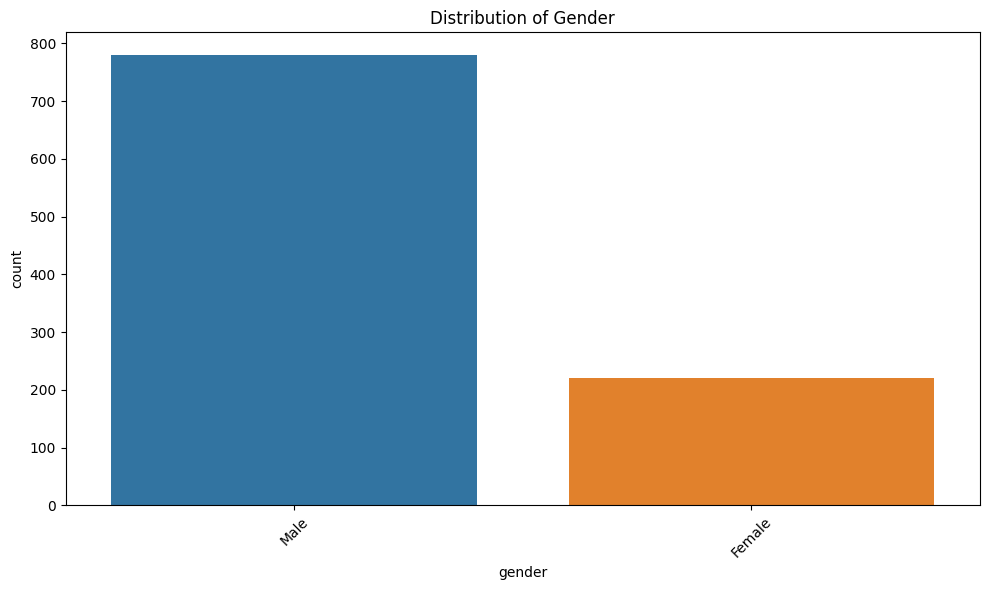

In [13]:
# Plot distributions
plot_categorical_distribution(sample, 'gender', 'Gender')

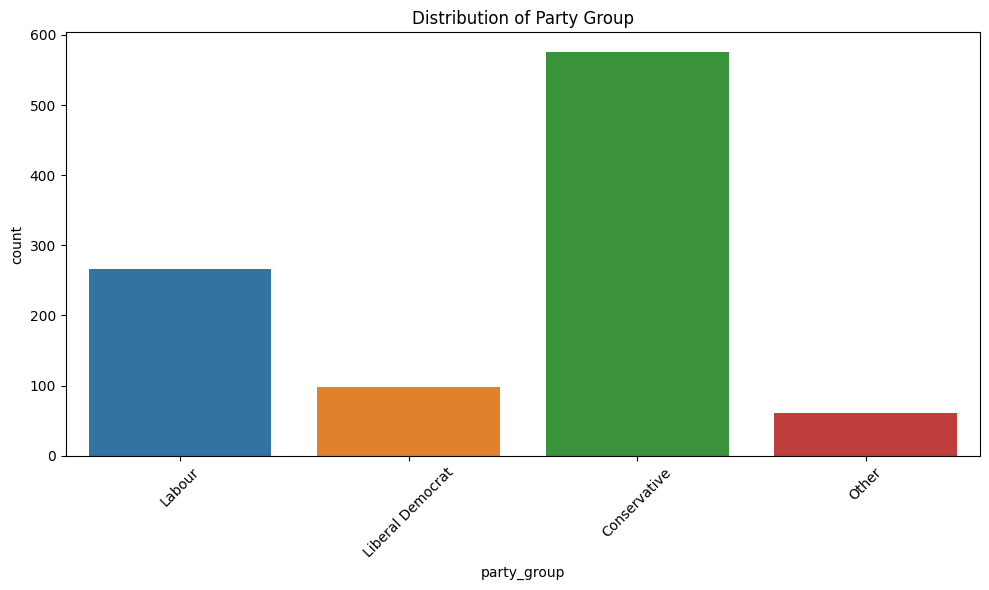

In [14]:
plot_categorical_distribution(sample, 'party_group', 'Party Group')

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


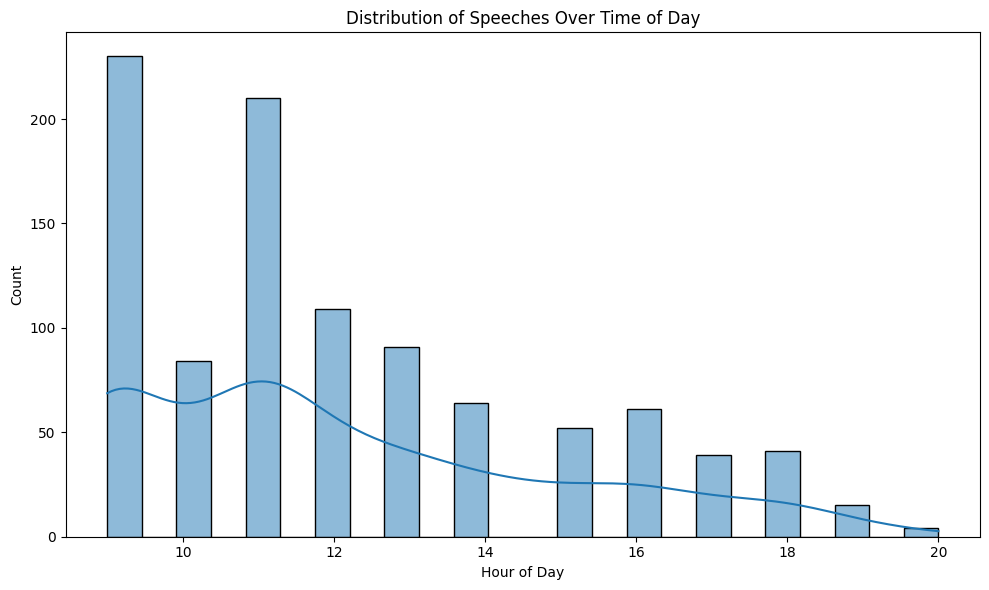

In [15]:
plot_time_distribution(sample)

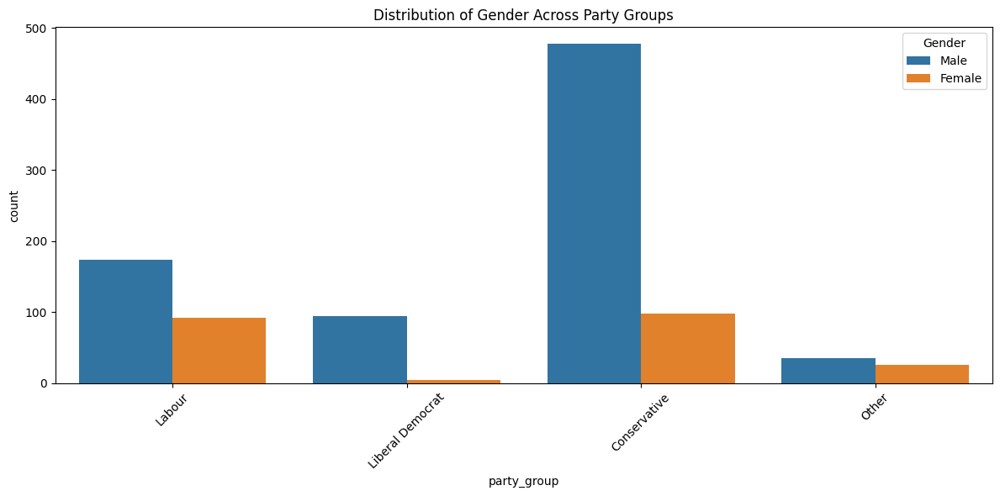

In [16]:
plot_gender_party_distribution(sample)

/tmp/ipykernel_23/3547493501.py:39: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(i, df_range['Max'][i], f"+{df_range['Max'][i]:.2f}", ha='center', va='bottom')
/tmp/ipykernel_23/3547493501.py:40: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(i, df_range['Min'][i], f"{df_range['Min'][i]:.2f}", ha='center', va='top')


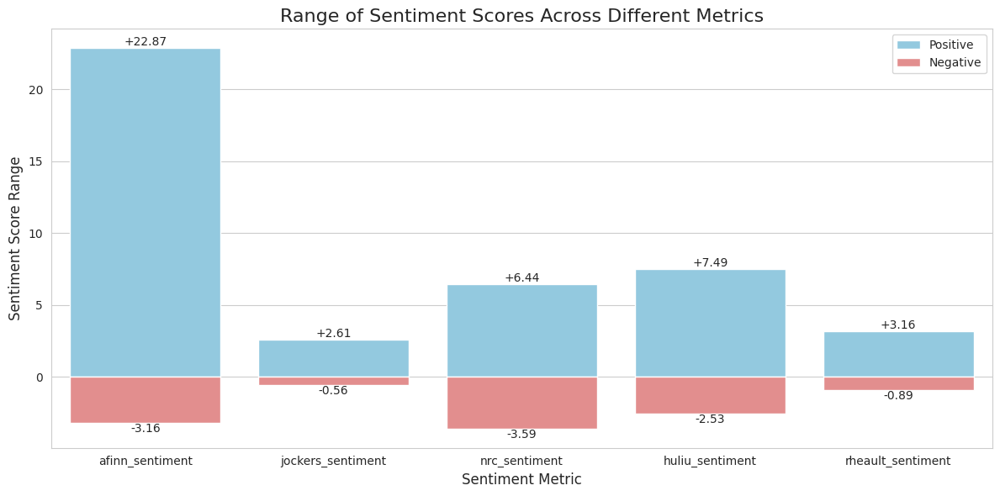

,Metric,Min,Max
afinn_sentiment,afinn_sentiment,-3.163154,22.865804
jockers_sentiment,jockers_sentiment,-0.559017,2.613534
nrc_sentiment,nrc_sentiment,-3.593836,6.435920
huliu_sentiment,huliu_sentiment,-2.526479,7.489772
rheault_sentiment,rheault_sentiment,-0.894427,3.160758


In [17]:
def sentiment_analysis_range(df, columns):
    """
    Calculate the min and max sentiment scores for each specified sentiment metric
    and create a bar plot visualization.

    Args:
    - df (pd.DataFrame): The input DataFrame containing sentiment scores.
    - columns (list of str): The list of sentiment metric columns to analyze.

    Returns:
    - pd.DataFrame: A DataFrame containing the metric names, minimum values, and maximum values.
    """
    # Select sentiment metric columns from the input DataFrame
    df_metrics = df[columns]

    # Calculate min and max for each sentiment metric
    df_range = pd.DataFrame({
        'Metric': df_metrics.columns,
        'Min': df_metrics.min(),
        'Max': df_metrics.max()
    })

    # Plotting the range of sentiment scores
    plt.figure(figsize=(12, 6))
    sns.set_style("whitegrid")

    # Create the visualization
    sns.barplot(x='Metric', y='Max', data=df_range, color='skyblue', label='Positive')
    sns.barplot(x='Metric', y='Min', data=df_range, color='lightcoral', label='Negative')

    # Customize the plot
    plt.title('Range of Sentiment Scores Across Different Metrics', fontsize=16)
    plt.xlabel('Sentiment Metric', fontsize=12)
    plt.ylabel('Sentiment Score Range', fontsize=12)
    plt.legend(loc='upper right', fontsize=10)

    # Add value labels on the bars
    for i, metric in enumerate(df_range['Metric']):
        plt.text(i, df_range['Max'][i], f"+{df_range['Max'][i]:.2f}", ha='center', va='bottom')
        plt.text(i, df_range['Min'][i], f"{df_range['Min'][i]:.2f}", ha='center', va='top')

    plt.tight_layout()
    plt.show()

    return df_range

sentiment_columns = ['afinn_sentiment', 'jockers_sentiment', 'nrc_sentiment', 'huliu_sentiment', 'rheault_sentiment']
df_range = sentiment_analysis_range(sample, sentiment_columns)
df_range

In [18]:
stats_summary['afinn_sentiment']['mean'], stats_summary['afinn_sentiment']['std']

(0.1682544217432012, 0.6612349230976298)

In [19]:
stats_summary

,eo_id,afinn_sentiment,afinn_sd,jockers_sentiment,jockers_sd,nrc_sentiment,nrc_sd,huliu_sentiment,huliu_sd,rheault_sentiment,...,url,person_id,hansard_membership_id,mnis_id,dods_id,pims_id,speaker_office,age,speaker_id,processed_column
count,2.230357e+06,2.230357e+06,1.893672e+06,2.230357e+06,1.893672e+06,2.230357e+06,1.893672e+06,2.230357e+06,1.893672e+06,2.230357e+06,...,0.0,128973.000000,1.256322e+06,2.230357e+06,2.230357e+06,2.230357e+06,0.0,2.230357e+06,1.101382e+06,2.230357e+06
mean,1.115198e+06,1.682544e-01,5.236760e-01,1.290766e-01,2.450211e-01,1.759086e-01,3.417740e-01,6.289320e-02,3.092717e-01,2.191952e-01,...,NaN,17598.324804,4.512963e+03,9.304214e+02,2.229632e+04,2.448626e+03,NaN,5.104716e+01,1.716193e+04,4.655410e-01
std,6.438600e+05,6.612349e-01,9.201066e-01,1.840158e-01,1.382440e-01,2.589687e-01,2.107249e-01,4.158641e-01,3.161838e-01,3.671582e-01,...,NaN,7073.286455,3.485805e+03,1.014140e+03,1.855904e+04,1.935754e+03,NaN,9.110780e+00,1.737798e+04,1.283799e+02
min,1.000000e+00,-3.117849e+02,0.000000e+00,-1.277864e+01,0.000000e+00,-2.413610e+01,0.000000e+00,-4.777568e+01,0.000000e+00,-1.728802e+01,...,NaN,10001.000000,2.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,NaN,2.000000e+01,6.870000e+02,0.000000e+00
25%,5.575990e+05,0.000000e+00,2.540003e-01,3.185789e-03,1.620185e-01,0.000000e+00,2.238552e-01,-4.463982e-02,1.779447e-01,1.122157e-01,...,NaN,10726.000000,1.334000e+03,3.000000e+02,0.000000e+00,6.630000e+02,NaN,4.500000e+01,1.617000e+03,3.839026e-03
50%,1.115198e+06,1.200368e-01,4.588315e-01,1.220867e-01,2.349796e-01,1.809939e-01,3.245783e-01,2.217826e-02,2.836299e-01,2.058427e-01,...,NaN,11927.000000,4.042000e+03,6.230000e+02,2.551200e+04,2.334000e+03,NaN,5.100000e+01,3.284000e+03,5.649365e-02
75%,1.672797e+06,3.922323e-01,6.757584e-01,2.343231e-01,3.098390e-01,3.162278e-01,4.233164e-01,2.010957e-01,3.922323e-01,3.091607e-01,...,NaN,24932.000000,7.224000e+03,1.191000e+03,2.648400e+04,4.165000e+03,NaN,5.700000e+01,4.014200e+04,2.108189e-01
max,2.230396e+06,3.076509e+02,5.969414e+02,1.937053e+01,1.457303e+01,1.952693e+01,4.798743e+01,3.810737e+02,1.672915e+02,4.784140e+02,...,NaN,25601.000000,1.662400e+04,4.595000e+03,1.472150e+05,6.194000e+03,NaN,8.500000e+01,4.070500e+04,9.720980e+04


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

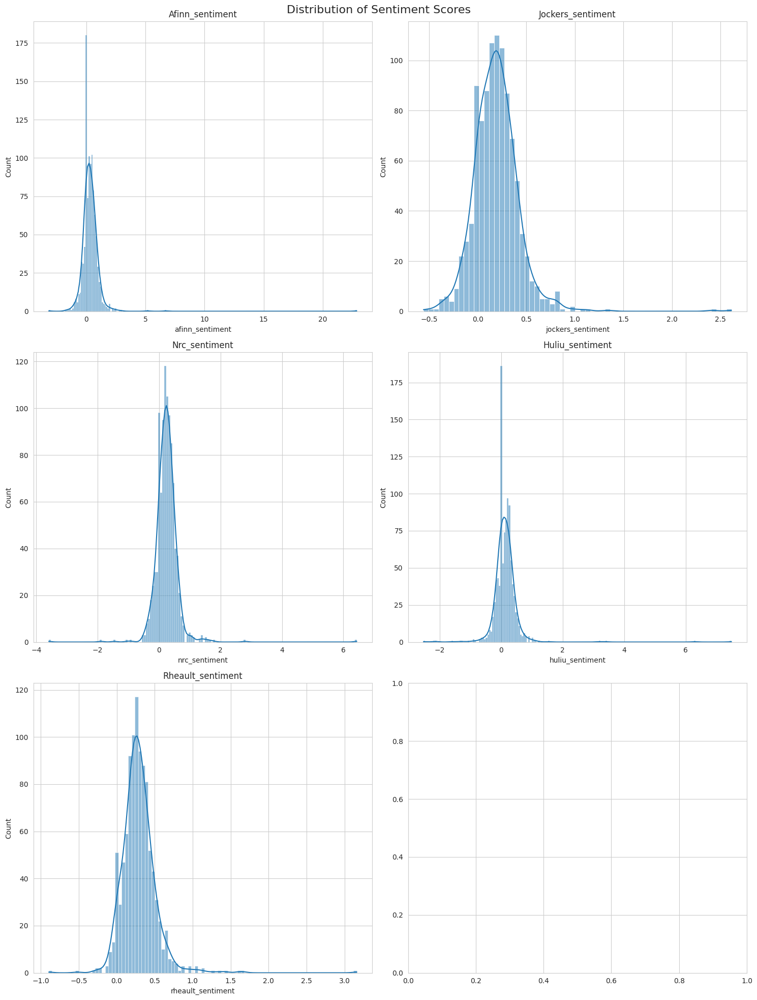

In [20]:
plot_sentiment_distribution(sample)

In [21]:
# Plot sentiment over time for a specific date
import plotly.graph_objects as go
plot_sentiment_over_time(sample, '2017-04-27', 'nrc_sentiment', 'nrc_sd', 'NRC Sentiment')

/tmp/ipykernel_23/1317141737.py:85: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['time'].fillna('10:51:00', inplace=True)


# 3. Speech Word Frequency and N-Gram Analysis: 
- Define a function to calculate the average sentiment score for each speech based on various sentiment metrics (afinn_sentiment, bing_sentiment, nrc_sentiment, sentiword_sentiment, hu_sentiment). Categorize all speeches into sentiment categories (e.g., Strongly Negative, Moderately Negative, Neutral, Moderately Positive, Strongly Positive), and identify the most frequent words for each category. Visualize these words using word clouds and bar charts, with separate visualizations for each sentiment category.

## Z-Normalization

In [22]:
import pandas as pd
import numpy as np

# Function definitions

def calculate_z_scores(df, sentiment_cols, means, stds):
    """
    Calculate the z-scores for specified columns in the DataFrame.

    Args:
    - df (pd.DataFrame): The input DataFrame.
    - sentiment_cols (list of str): The list of sentiment column names.
    - means (dict): A dictionary of mean values for each sentiment column.
    - stds (dict): A dictionary of standard deviation values for each sentiment column.

    Returns:
    - pd.DataFrame: DataFrame containing z-scores for the specified columns.
    """
    z_scores = df[sentiment_cols].apply(lambda col: (col - means[col.name]) / stds[col.name])
    return z_scores

def identify_outliers(df, sentiment_cols, threshold=3):
    """
    Identify outliers in the DataFrame based on z-scores.

    Args:
    - df (pd.DataFrame): The input DataFrame with z-scores.
    - sentiment_cols (list of str): The list of sentiment column names.
    - threshold (float): The z-score threshold to identify outliers.

    Returns:
    - pd.DataFrame: DataFrame with boolean values indicating outliers.
    """
    z_scores = calculate_z_scores(df, sentiment_cols, means, stds)
    outliers = (z_scores.abs() > threshold).any(axis=1)
    return outliers

def normalized_sentiment(df, sentiment_cols, means, stds):
    """
    Calculate z-normalized sentiment for specified columns in the DataFrame using provided means and standard deviations.

    Args:
    - df (pd.DataFrame): The input DataFrame containing sentiment columns.
    - sentiment_cols (list of str): The list of sentiment column names to normalize.
    - means (dict): A dictionary of mean values for each sentiment column.
    - stds (dict): A dictionary of standard deviation values for each sentiment column.

    Returns:
    - pd.DataFrame: The updated DataFrame with new columns for each sentiment's z-score.
    """
    z_scores = calculate_z_scores(df, sentiment_cols, means, stds)
    for col in sentiment_cols:
        df[f'{col}_z'] = z_scores[col]
    return df

def weighted_normalized_sentiment(df, sentiment_cols, weights):
    """
    Calculate weighted normalized sentiment for specified columns in the DataFrame.

    Args:
    - df (pd.DataFrame): The input DataFrame containing sentiment columns.
    - sentiment_cols (list of str): The list of sentiment column names to normalize.
    - weights (list of float): The list of weights corresponding to each sentiment column.

    Returns:
    - pd.DataFrame: The updated DataFrame with a new column 'weighted_normalized_sentiment' containing the results.
    """
    if len(sentiment_cols) != len(weights):
        raise ValueError("The number of sentiment columns must match the number of weights.")
    
    normalized_values = df[[f'{col}_z' for col in sentiment_cols]]
    weighted_sum = (normalized_values * weights).sum(axis=1)
    df['average_sentiment'] = weighted_sum / sum(weights)
    return df

def categorize_sentiment(score):
    """
    Categorizes a sentiment score into one of five categories based on specified ranges.

    Args:
    - score (float): The sentiment score to categorize.

    Returns:
    - str: The category of the sentiment score.
    """
    if -3 <= score < -1.8:
        return 'Strongly Negative'
    elif -1.8 <= score < -0.6:
        return 'Moderately Negative'
    elif -0.6 <= score < 0.6:
        return 'Neutral'
    elif 0.6 <= score < 1.8:
        return 'Moderately Positive'
    elif 1.8 <= score <= 3:
        return 'Strongly Positive'
    else:
        return 'Out of defined range'



## Most Frequent Words

In [23]:
# Identify the most frequent words for each sentiment category
def most_frequent_words(sent_category):
    category_speeches = sample[sample['sentiment_category'] == sent_category]
    all_words = [word for tokens in category_speeches['speech_processed'] for word in tokens]
    word_freq = nltk.FreqDist(all_words)
    return word_freq

def plot_wordcloud(word_freq, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)
    plt.figure(figsize=(10, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

# Create bar charts for the most frequent words in each sentiment category
def plot_barchart(word_freq, title):
    plt.figure(figsize=(10, 6))
    sns.barplot(x=list(word_freq.values())[:20], y=list(word_freq.keys())[:20])
    plt.title(title)
    plt.xlabel('Frequency')
    plt.ylabel('Words')
    plt.show()

# for category in sentiment_categories:
#     word_freq = most_frequent_words(category)
#     plot_barchart(word_freq, f'Most Frequent Words for {category} Sentiment')

# 4. Cross-Category Analysis: 
Repeat the word frequency and n-gram analysis for different features such as party_group, ministry, and government to identify patterns across political affiliations and demographic groups.

In [24]:
def most_frequent_words_by_category(column_name, category_name):
    category_speeches = sample[sample[column_name] == category_name]
    all_words = [word for tokens in category_speeches['speech_processed'] for word in tokens]
    word_freq = nltk.FreqDist(all_words)
    return word_freq

def cross_category_analysis(column_name):
    categories = sample[column_name].unique()
    for category in categories:
        word_freq = most_frequent_words_by_category(column_name, category)
    plot_wordcloud(word_freq, f'Word Cloud for {category} in {column_name}')

# 5. Demographic-Based Speech Similarity Calculation: 
Propose a method for calculating the similarity between speeches by considering demographic characteristics of the speakers, including date_of_birth, gender, party, age, party_group, ministry, and government. Use these similarities to explore how demographic factors influence speech content.

In [25]:
def demographic_similarity(df):
    demographic_columns = ['date_of_birth', 'gender', 'party', 'age', 'party_group', 'ministry', 'government']
    df_demographics = df[demographic_columns].apply(lambda x: pd.factorize(x)[0])
    similarity_matrix = cosine_similarity(df_demographics)
    return similarity_matrix

# 6. Speech Text-Based Speech Similarity Calculation: 
Develop methods for calculating speech similarity based on textual content, including TF-IDF, Semantic Similarity, and Doc2Vec. Use these methods to analyze the thematic relationships between speeches based on their textual content.

In [26]:
def tfidf_similarity(df):
    vectorizer = TfidfVectorizer(tokenizer=lambda x: x, preprocessor=lambda x: x)
    tfidf_matrix = vectorizer.fit_transform(df['speech_processed'])
    return cosine_similarity(tfidf_matrix)

def semantic_similarity():
    raise NotImplementedError("Semantic similarity calculation requires more advanced embeddings such as BERT, Word2Vec, etc.")

from gensim.models.doc2vec import TaggedDocument, Doc2Vec
from sklearn.metrics.pairwise import cosine_similarity

def doc2vec_similarity(df):
    """
    Calculate the cosine similarity between documents using Doc2Vec.

    Args:
    - df (pd.DataFrame): A DataFrame containing a column 'speech_processed' with preprocessed text documents.

    Returns:
    - similarity_matrix (numpy.ndarray): A matrix containing cosine similarity scores between the document vectors.
    """
    # Ensure necessary columns exist in the DataFrame
    if 'speech_processed' not in df.columns:
        raise ValueError("The DataFrame must contain a 'speech_processed' column with text data.")

    # Create tagged documents for training
    documents = [TaggedDocument(doc, [i]) for i, doc in enumerate(df['speech_processed'])]
    
    # Initialize Doc2Vec model
    model = Doc2Vec(vector_size=50, min_count=2, epochs=40)
    
    # Build vocabulary from tagged data
    model.build_vocab(documents)
    
    # Train the model with the tagged documents
    model.train(documents, total_examples=model.corpus_count, epochs=model.epochs)

    # Create vectors for each document
    vectors = [model.infer_vector(doc.words) for doc in documents]

    # Calculate cosine similarity
    similarity_matrix = cosine_similarity(vectors)
    
    return similarity_matrix



# 7. Speech Clustering: 
- Using the speech similarities calculated in Tasks 5 and 6, apply suitable clustering algorithms (e.g., K-Means, DBSCAN, or Agglomerative Clustering) to group similar speeches. Perform the clustering separately for demographic data and text data, then compare and discuss the clustering outcomes.

In [27]:
from sklearn.metrics.pairwise import cosine_distances

def perform_clustering(similarity_matrix, n_clusters=5):
    clustering_model = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = clustering_model.fit_predict(similarity_matrix)
    return cluster_labels

def apply_dbscan(similarity_matrix, eps=0.5, min_samples=5):
    distance_matrix = cosine_distances(similarity_matrix)  # Using cosine distance directly
    clustering_model = DBSCAN(eps=eps, min_samples=min_samples, metric='precomputed')
    cluster_labels = clustering_model.fit_predict(distance_matrix)
    return cluster_labels


def apply_agglomerative_clustering(similarity_matrix, n_clusters=5):
    clustering_model = AgglomerativeClustering(n_clusters=n_clusters, affinity='precomputed', linkage='average')
    cluster_labels = clustering_model.fit_predict(1 - similarity_matrix)
    return cluster_labels

In [28]:
# doc2vec_similarity_matrix

In [29]:
import numpy as np
from sklearn.metrics.pairwise import cosine_distances
from sklearn.cluster import DBSCAN

def apply_dbscan(similarity_matrix, eps=0.5, min_samples=5):
    """
    Apply DBSCAN algorithm to a given similarity matrix and return cluster labels.

    Args:
    - similarity_matrix (numpy.ndarray): The input similarity matrix.
    - eps (float): The maximum distance between two points to be considered as neighbors.
    - min_samples (int): The minimum number of points required to form a dense region.

    Returns:
    - cluster_labels (numpy.ndarray): The cluster labels assigned to each point.
    """
    distance_matrix = cosine_distances(similarity_matrix)  # Using cosine distance directly
    clustering_model = DBSCAN(eps=eps, min_samples=min_samples, metric='precomputed')
    cluster_labels = clustering_model.fit_predict(distance_matrix)
    
    return cluster_labels

# # Tune the parameters to find a configuration that results in 5 clusters.
# # This will require several iterations.
# eps_values = [0.4, 0.5, 0.6]  # Example epsilon values to test
# min_samples_values = [2, 3, 4, 5]  # Example min_samples values to test

# for eps in eps_values:
#     for min_samples in min_samples_values:
#         cluster_labels = apply_dbscan(doc2vec_similarity_matrix, eps=eps, min_samples=min_samples)
#         n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)
#         print(f"eps: {eps}, min_samples: {min_samples}, Number of clusters: {n_clusters}")

# # Choose a configuration based on the number of clusters closest to 5.
# final_eps = 0.5
# final_min_samples = 2  # Adjust these values based on the results of the iteration

# final_cluster_labels = apply_dbscan(doc2vec_similarity_matrix, eps=final_eps, min_samples=final_min_samples)
# print(f"Final cluster labels (aim for 5 clusters): {final_cluster_labels}")

In [30]:
# tfidf_similarity_matrix = tfidf_similarity(sample)
# tfidf_similarity_matrix

# demographic_similarity_matrix = demographic_similarity(sample)
# demographic_similarity_matrix

# doc2vec_similarity_matrix = doc2vec_similarity(sample)
# doc2vec_similarity_matrix

In [31]:
# # Clustering based on text data (replace tfidf_similarity_matrix with doc2vec_similarity_matrix if available)
# text_clusters_kmeans = perform_clustering(tfidf_similarity_matrix)
# text_clusters_dbscan = apply_dbscan(tfidf_similarity_matrix)
# text_clusters_agglomerative = apply_agglomerative_clustering(tfidf_similarity_matrix)

In [32]:
# # Clustering based on demographic data
# demographic_clusters_kmeans = perform_clustering(demographic_similarity_matrix)
# demographic_clusters_dbscan = apply_dbscan(demographic_similarity_matrix)
# demographic_clusters_agglomerative = apply_agglomerative_clustering(demographic_similarity_matrix)

In [33]:
# min(demographic_clusters_kmeans), max(demographic_clusters_kmeans)

In [34]:
# min(demographic_clusters_dbscan), max(demographic_clusters_dbscan)

In [35]:
# min(demographic_clusters_agglomerative), max(demographic_clusters_agglomerative)

In [36]:
# min(text_clusters_kmeans), max(text_clusters_kmeans)

In [37]:
# min(text_clusters_dbscan), max(text_clusters_dbscan)

In [38]:
# min(text_clusters_agglomerative), max(text_clusters_agglomerative)

In [39]:
# import pandas as pd

# # Create a DataFrame
# df_clusters = pd.DataFrame({
#     'Demographic Cluster KMeans': demographic_clusters_kmeans,
#     'Demographic Cluster Agglomerative': demographic_clusters_agglomerative,
#     'Text Cluster KMeans': text_clusters_kmeans,
#     'Text Cluster Agglomerative': text_clusters_agglomerative
# })

# df_clusters

# 8. Cluster Analysis: 
- For each of the identified speech clusters, find the average sentiment score, most frequent words, and topics using suitable topic modeling techniques (e.g., LDA, LSA). Visualize the results to identify interesting patterns or trends related to speech clusters. Discuss significant insights, such as clusters that show strong positive or negative sentiment trends and highlight notable patterns focus and sentiment expression.

In [40]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer, WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.decomposition import LatentDirichletAllocation
from gensim.models import LdaModel
import pyLDAvis.gensim_models as gensimvis
import pyLDAvis

In [41]:
### 8. Cluster Analysis
import pandas as pd
from gensim.models import LdaModel
from gensim.corpora.dictionary import Dictionary
import pyLDAvis.gensim as gensimvis
import pyLDAvis

def analyze_clusters(cluster_labels, df):
    """
    Analyze clusters using LDA and store the topics and cluster analysis into separate DataFrames.

    Args:
    - cluster_labels (array-like): Cluster labels obtained from a clustering algorithm.
    - df (pd.DataFrame): DataFrame containing the data to be analyzed.

    Returns:
    - topics_df (pd.DataFrame): DataFrame containing the LDA topics for each cluster.
    - cluster_dfs (dict): Dictionary of DataFrames, one for each cluster with cluster analysis details.
    - combined_df (pd.DataFrame): DataFrame containing the aggregated cluster analysis details.
    """
    # Add cluster labels to the DataFrame
    df['cluster'] = cluster_labels
    
    # Aggregate cluster information
    cluster_analysis = df.groupby('cluster').agg(
        average_sentiment=('average_sentiment', 'mean'),
        speech_count=('speech', 'count')
    ).reset_index()
    
    # Initialize DataFrame to store topics
    topics_df = pd.DataFrame(columns=['Cluster ID', 'Topic ID', 'Words'])
    
    # Initialize a dictionary to store DataFrames for each cluster
    cluster_dfs = {}

    for cluster in cluster_analysis['cluster']:
        cluster_data = df[df['cluster'] == cluster]
        word_freq = most_frequent_words_by_category('cluster', cluster)
        plot_wordcloud(word_freq, f'Word Cloud for Cluster {cluster}')
        plot_barchart(word_freq, f'Most Frequent Words for Cluster {cluster}')

        # Prepare documents and dictionary for LDA
        dictionary = Dictionary(cluster_data['speech_processed'])
        corpus = [dictionary.doc2bow(text) for text in cluster_data['speech_processed']]
        lda_model = LdaModel(corpus=corpus, num_topics=5, id2word=dictionary, random_state=42)
        
        # Visualize topics with pyLDAvis
        lda_vis = gensimvis.prepare(lda_model, corpus, dictionary)
        pyLDAvis.display(lda_vis)

        # Store cluster analysis output into a separate DataFrame for each cluster
        cluster_specific_df = cluster_analysis[cluster_analysis['cluster'] == cluster].reset_index(drop=True)
        cluster_dfs[f'cluster_{cluster}_df'] = cluster_specific_df

        print(f'Cluster {cluster} Analysis')
        print(cluster_specific_df)
        print(f'Topics in Cluster {cluster}:')

        # Extract topics and store them in the DataFrame
        for idx, topic in enumerate(lda_model.show_topics(formatted=False)):
            words = [word for word, _ in topic[1]]
            new_row = pd.DataFrame({
                'Cluster ID': [cluster],
                'Topic ID': [idx + 1],
                'Words': [words]
            })
            topics_df = pd.concat([topics_df, new_row], ignore_index=True)
                                  
    # Creating an empty DataFrame with specified columns
    combined_df = pd.DataFrame(columns=['cluster', 'average_sentiment', 'speech_count'])
                                  
    # Loop through each DataFrame in the cluster_dfs dictionary
    for key, df in cluster_dfs.items():
        # Extract cluster ID from the key, e.g., 'cluster_0_df' -> 0
        cluster_id = int(key.split('_')[1])

        # Extract the average sentiment and speech count from the DataFrame
        if not df.empty:
            average_sentiment = df['average_sentiment'].values[0]  # Assuming there's only one row
            speech_count = df['speech_count'].values[0]  # Assuming there's only one row

            # Append a new row to combined_df
            new_row = pd.DataFrame({
                'cluster': [cluster_id],
                'average_sentiment': [average_sentiment],
                'speech_count': [speech_count]
            })
            combined_df = pd.concat([combined_df, new_row], ignore_index=True)
    
    return topics_df, cluster_dfs, combined_df



In [42]:
# cluster_dfs

In [43]:
# topics_df

In [44]:
# cluster_dfs

In [45]:
# topics_df

In [46]:
# cluster_dfs

In [47]:
# topics_df

In [48]:
# # Analyze clusters and get topics DataFrame
# topics_df, cluster_dfs, combined_df = analyze_clusters(text_clusters_agglomerative, sample)

# # Displaying the content of each cluster DataFrame
# for cluster, df in cluster_dfs.items():
#     print(f'\nDataFrame for {cluster}:')
#     print(df)

# # Displaying the combined DataFrame
# print('\nCombined DataFrame:')
# combined_df

In [49]:
# cluster_dfs

In [50]:
# topics_df

# 9. Correlation Between Features and Sentiment: 
- Calculate correlations between various features (speech_date, year, gender, party_group, ministry, government) and sentiment scores (e.g., afinn_sentiment, nrc_sentiment). Analyze whether specific attributes (e.g., a particular party or ministry) are more likely to convey positive or negative sentiment. Visualize these findings using distribution plots to explore potential patterns.

In [51]:
def identify_categorical_columns(df):
    categorical_columns = [col for col in df.columns if df[col].dtype == 'object']
#     finite_unique_value_columns = [col for col in df.columns if (len(tuple(df[col].unique())) < 10) and df[col].dtype != 'object']
    return categorical_columns #+ finite_unique_value_columns

def apply_one_hot_encoding(df, categorical_columns):
    df_encoded = pd.get_dummies(df, columns=categorical_columns, drop_first=False)
    return df_encoded

def calculate_correlation(df):
    correlation_features_updated = ['afinn_sentiment_z', 'jockers_sentiment_z', 'nrc_sentiment_z', 'huliu_sentiment_z', 'rheault_sentiment_z', 'average_sentiment'] + one_hot_encoded_columns
    corr_matrix = df[correlation_features_updated].apply(pd.to_numeric, errors='coerce').corr()
    plt.figure(figsize=(12, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
    plt.title('Correlation Between Features and Sentiment Scores')
    plt.show()
    return corr_matrix

One-Hot Encoded Columns:
['year_2013.0',
 'ministry_Cameron1',
 'gender_Female',
 'gender_Male',
 'speech_date_2013-06-06',
 'speech_date_2013-06-11',
 'speech_date_2013-06-13',
 'speech_date_2013-06-18',
 'speech_date_2013-06-20',
 'party_group_Conservative',
 'party_group_Labour',
 'party_group_Liberal Democrat',
 'party_group_Other',
 'government_Government',
 'government_Opposition']

In [52]:
sample.columns

Index(['pp_id', 'eo_id', 'speech', 'afinn_sentiment', 'afinn_sd',
       'jockers_sentiment', 'jockers_sd', 'nrc_sentiment', 'nrc_sd',
       'huliu_sentiment', 'huliu_sd', 'rheault_sentiment', 'rheault_sd',
       'word_count', 'speech_date', 'year', 'time', 'url', 'as_speaker',
       'speaker_id', 'person_id', 'hansard_membership_id', 'mnis_id',
       'dods_id', 'pims_id', 'proper_name', 'party_group', 'party',
       'government', 'speaker_office', 'age', 'gender', 'date_of_birth',
       'house_start_date', 'house_end_date', 'ministry', 'speech_processed',
       'len_speech_processed', 'speech_processed_final',
       'len_speech_processed_final'],
      dtype='object')

In [53]:
sample

,pp_id,eo_id,speech,afinn_sentiment,afinn_sd,jockers_sentiment,jockers_sd,nrc_sentiment,nrc_sd,huliu_sentiment,...,age,gender,date_of_birth,house_start_date,house_end_date,ministry,speech_processed,len_speech_processed,speech_processed_final,len_speech_processed_final
0,uk.org.publicwhip/debate/2013-06-06b.1756.2,2000035,"c(""It is true to say that very little of what ...",-0.265684,3.219439,0.059695,0.309071,0.080234,0.669475,-0.060833,...,62,Male,1950-09-15,1997-05-01,NaN,Cameron1,"[c, true, say, littl, discus, chamber, beyond,...",566,"[true, say, littl, discus, chamber, beyond, di...",564
1,uk.org.publicwhip/debate/2013-06-06b.1759.0,2000036,"c(""The debate about pollinators and pesticides...",0.055609,1.745916,0.099597,0.333835,0.322938,0.445928,0.000543,...,48,Female,1965-03-26,2005-05-05,NaN,Cameron1,"[c, debat, pollin, pesticid, tend, seen, debat...",756,"[debat, pollin, pesticid, tend, seen, debat, b...",754
2,uk.org.publicwhip/debate/2013-06-06b.1761.0,2000037,"c(""I, too, congratulate the Chair of the Envir...",0.076618,0.892331,0.038996,0.335624,0.116778,0.437213,-0.164810,...,56,Female,1956-12-04,2005-05-05,NaN,Cameron1,"[c, congratul, chair, environment, audit, comm...",754,"[congratul, chair, environment, audit, committ...",753
3,uk.org.publicwhip/debate/2013-06-06b.1764.0,2000038,"c(""I begin by echoing other Membersâ tribute...",0.463118,0.566264,0.191108,0.250156,0.306488,0.340074,0.136243,...,49,Male,1964-02-20,2001-06-07,2015-03-30,Cameron1,"[c, begin, echo, tribut, hon, friend, member, ...",399,"[begin, echo, tribut, hon, friend, member, nor...",398
4,uk.org.publicwhip/debate/2013-06-06b.1765.0,2000039,indicated assent.\n,0.000000,NaN,0.282843,NaN,0.707107,NaN,0.000000,...,59,Male,1954-03-16,1997-05-01,2015-03-30,Cameron1,"[indic, assent]",2,"[indic, assent]",2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,uk.org.publicwhip/debate/2013-06-20b.1042.5,2001030,The potential benefits of becoming the UK city...,1.424079,NaN,0.766812,NaN,1.351049,NaN,0.365148,...,45,Male,1968-06-05,2005-05-05,NaN,Cameron1,"[potenti, benefit, becom, uk, citi, cultur, in...",18,"[potenti, benefit, becom, uk, citi, cultur, in...",18
996,uk.org.publicwhip/debate/2013-06-20b.1042.6,2001031,I am sure the Minister will be aware of early-...,0.340353,0.410994,0.067045,0.132634,0.047319,0.327509,-0.018184,...,56,Male,1956-11-17,2005-05-05,2015-03-30,Cameron1,"[sure, minist, awar, motion, 156, tabl, name, ...",32,"[sure, minist, awar, motion, 156, tabl, name, ...",32
997,uk.org.publicwhip/debate/2013-06-20b.1042.7,2001032,"I think we will give that one a miss, because ...",-0.196907,0.703600,-0.266617,0.250847,0.000000,0.000000,-0.424061,...,50,Male,1963-01-19,1997-05-01,NaN,Cameron1,"[think, give, one, miss, minist, respons, poli...",38,"[think, give, one, miss, minist, respons, poli...",38
998,uk.org.publicwhip/debate/2013-06-20b.1042.9,2001033,What her policy is on the repatriation of indi...,0.000000,NaN,0.000000,NaN,0.000000,NaN,0.000000,...,47,Male,1966-03-17,2001-06-07,NaN,Cameron1,"[polici, repatri, indigen, australian, human, ...",9,"[polici, repatri, indigen, australian, human, ...",9


# 10. Topic Evolution Over Time: 
Track how topics evolve over time by leveraging Dynamic Topic Modeling (LDA) and BERTopic’s time-based analysis. Visualize topic trends across different periods (e.g., by year or government term) to study shifts in policy focus and emotional expression. Additionally, analyze and visualize how topics are distributed across different political parties, speakers (proper_name), and ministries. Use topic distributions to reveal trends in political discourse, differences in focus, and variations in how topics are addressed by different government sectors.

In [54]:
!pip install --upgrade gensim

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 32.8 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.14.1
    Uninstalling scipy-1.14.1:
      Successfully uninstalled scipy-1.14.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cuml 24.8.0 requires cupy-cuda11x>=12.0.0, which is not installed.
cesium 0.12.3 requires numpy<3.0,>=2.0, but you have numpy 1.26.4 which is incompatible.
libpysal 4.9.2 requires packaging>=22, but you have packaging 21.3 which is incompatible.
libpysal 4.9.2 requires shapely>=2.0.1, but you have shapely 1.8.5.post1 which is incompatible.
tsfresh 0.20.3 requires scipy>=1.14.0; python_version >= "3.10", but you have scipy 1.13.1 which is incompatible.


In [55]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from bertopic import BERTopic

# Dynamic Topic Modeling (LDA) using scikit-learn
def dynamic_topic_modeling_sklearn(data, num_topics=10):
    vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
#     tfidf = vectorizer.fit_transform(data['speech_processed'])
    tfidf = vectorizer.fit_transform(data['speech_processed'].apply(' '.join))

    lda = LatentDirichletAllocation(n_components=num_topics, max_iter=50, learning_method='online', random_state=0)
    lda.fit(tfidf)
    
    return lda, vectorizer, tfidf

# Visualize LDA results with word clouds
def visualize_lda_wordclouds(lda, vectorizer, num_words=15):
    terms = vectorizer.get_feature_names_out()
    for idx, topic in enumerate(lda.components_):
        print(f"Topic {idx+1}:")
        wordcloud = WordCloud(width=800, height=400, max_words=num_words, background_color='white').fit_words(dict(zip(terms, topic)))
        plt.figure()
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.show()
        
# BERTopic implementation for time-based analysis
def bertopic_time_analysis(data):
    # Fit the BERTopic model
    model = BERTopic()
    topics, probs = model.fit_transform(data['speech'].tolist())

    # Extract timestamps for temporal analysis
    timestamps = data['year'].tolist()

    # Perform temporal topic modeling
    topics_over_time = model.topics_over_time(data['speech'].tolist(), timestamps)

    # Visualize topics over time
    model.visualize_topics_over_time(topics_over_time)
    
    return model

# Analyze and visualize topics distribution
def analyze_topic_distribution(model, data, column):
    data['topic'] = model.get_document_info(data['speech'].astype(str).tolist())['Topic']

    plt.figure(figsize=(10, 6))
    sns.countplot(x='topic', hue=column, data=data)
    plt.title(f'Topics Distribution across {column}')
    plt.show()

/opt/conda/lib/python3.10/site-packages/importlib_metadata/__init__.py:459: DeprecationWarning:

Implicit None on return values is deprecated and will raise KeyErrors.



# 11. Named Entity Recognition (NER) for Speaker and Content Analysis: 
- Apply Named Entity Recognition (NER) to the speech text to identify and categorize key entities such as persons, organizations, locations, dates, and policy-related terms. The goal is to understand how specific entities are referenced across different speeches and how they relate to the sentiment expressed.
1. Identify the most frequently mentioned entities and analyze how often certain entities (e.g., key political figures, organizations, or policy terms) appear in positive or negative contexts.
2. Examine co-occurrence patterns between entities to detect associations (e.g., politicians frequently mentioned alongside specific policies or issues). Visualize these associations using network graphs to reveal relationships and alliances within the discourse.
3. Cross-Feature Analysis: Explore how named entities are distributed across different features such as party_group, ministry and gender and analyze whether certain entities are predominantly mentioned by specific parties or ministries and how these mentions correlate with sentiment trends.

In [56]:
!pip install pyvis

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning:

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 19.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.3/46.3 kB 2.9 MB/s eta 0:00:00


In [57]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from bertopic import BERTopic
import spacy
from collections import Counter
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
import networkx as nx
from pyvis.network import Network

# Load spaCy model for NER
nlp = spacy.load("en_core_web_sm")

# Function to extract named entities and their counts
def extract_named_entities(text):
    doc = nlp(text)
    entities = [(ent.text, ent.label_) for ent in doc.ents]
    return entities

# Function to analyze named entity occurrences
def analyze_named_entities(data):
    data['entities'] = data['speech'].apply(extract_named_entities)
    all_entities = [entity for sublist in data['entities'] for entity in sublist]
    entity_counts = Counter(all_entities)
    entity_df = pd.DataFrame(entity_counts.most_common(), columns=['Entity', 'Count'])

    # Break entity column into text and label for easier analysis
    entity_df[['Entity_Text', 'Entity_Label']] = pd.DataFrame(entity_df['Entity'].tolist(), index=entity_df.index)
    entity_df.drop(columns=['Entity'], inplace=True)
    return entity_df

# Function to categorize sentiment scores
def categorize_sentiment(scores):
    bins = [-3, -1.8, -0.6, 0.6, 1.8, 3]
    labels = ['Strongly Negative', 'Moderately Negative', 'Neutral', 'Moderately Positive', 'Strongly Positive']
    return pd.cut(scores, bins=bins, labels=labels)

# Function to build and test ML models
def build_ml_models(X, y, model_type='logistic'):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    if model_type == 'logistic':
        model = LogisticRegression()
    # Additional models can be added here (e.g., RandomForest, SVM, LSTM, RNN)
    
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred)
    return model, acc, report

# NER Analysis
def run_ner_analysis(data):
    entity_df = analyze_named_entities(data)
    print(entity_df.head())

    # Most frequently mentioned entities and context analysis
    positive_context = entity_df[entity_df['Entity_Label'] == 'POSITIVE']
    negative_context = entity_df[entity_df['Entity_Label'] == 'NEGATIVE']

    # Co-occurrence patterns
    entity_pairs = [(entity1, entity2) for speech_entities in data['entities'] 
                    for i, entity1 in enumerate(speech_entities) 
                    for entity2 in speech_entities[i + 1:]]

    co_occurrence = Counter(entity_pairs)
    co_occurrence_df = pd.DataFrame(co_occurrence.most_common(), columns=['Entity_Pair', 'Count'])
    
    # Network Visualization
    def visualize_cooccurrence_network(co_occurrence_df):
        G = nx.Graph()
        for _, row in co_occurrence_df.iterrows():
            G.add_edge(row['Entity_Pair'][0][0], row['Entity_Pair'][1][0], weight=row['Count'])

        net = Network(notebook=True)
        net.from_nx(G)
        net.show("co_occurrence_network.html")

    visualize_cooccurrence_network(co_occurrence_df)

    # Cross-Feature Analysis
    data['sentiment_category'] = categorize_sentiment(data['average_sentiment'])
    cross_feature_analysis = data.groupby(['party_group', 'ministry', 'gender', 'sentiment_category'])['entities'].apply(lambda x: Counter([item for sublist in x for item in sublist])).unstack(fill_value=0)
    print(cross_feature_analysis.head())

# Emotion Prediction Using Extracted Features
def run_emotion_prediction(data):
    # Demographic Features Only
    demographic_features = data[['gender', 'party_group', 'age']]
    demographic_features = pd.get_dummies(demographic_features)
    demographic_target = data['sentiment_category']
    demo_model, demo_acc, demo_report = build_ml_models(demographic_features, demographic_target)
    print("Demographic Features Only - Accuracy: ", demo_acc)
    print(demo_report)

    # Text Features Only
    # Prepare text data (example using TF-IDF vectorizer; alternative embeddings can be used)
    vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, stop_words='english')
    
    # Preprocess 'speech' column to handle empty strings and stop words
    data['speech'] = data['speech'].apply(lambda x: ' '.join([word for word in x.split() if word.lower() not in vectorizer.get_stop_words()]))
    data = data[data['speech'].str.strip() != '']  # Remove rows with empty 'speech'

    text_features = vectorizer.fit_transform(data['speech'])
    text_target = data['sentiment_category']
    text_model, text_acc, text_report = build_ml_models(text_features, text_target)
    print("Text Features Only - Accuracy: ", text_acc)
    print(text_report)

    # Combined Features
    combined_features = np.hstack((demographic_features, text_features.toarray()))
    combined_model, combined_acc, combined_report = build_ml_models(combined_features, text_target)
    print("Combined Features - Accuracy: ", combined_acc)
    print(combined_report)

In [58]:
sample.iloc[0]

pp_id                               uk.org.publicwhip/debate/2013-06-06b.1756.2
eo_id                                                                   2000035
speech                        c("It is true to say that very little of what ...
afinn_sentiment                                                       -0.265684
afinn_sd                                                               3.219439
jockers_sentiment                                                      0.059695
jockers_sd                                                             0.309071
nrc_sentiment                                                          0.080234
nrc_sd                                                                 0.669475
huliu_sentiment                                                       -0.060833
huliu_sd                                                               0.688664
rheault_sentiment                                                      0.210271
rheault_sd                              

In [59]:
# import pandas as pd
# import numpy as np
# from sklearn.feature_extraction.text import TfidfVectorizer
# from sklearn.model_selection import train_test_split
# from sklearn.linear_model import LogisticRegression
# from sklearn.metrics import accuracy_score, classification_report

# # Bin the continuous sentiment scores into categories
# # Define bins: negative (< -0.1), neutral ([-0.1, 0.1]), positive (> 0.1)

# bins = [-3, -1.8, -0.6, 0.6, 1.8, 3]
# labels = ['Strongly Negative', 'Moderately Negative', 'Neutral', 'Moderately Positive', 'Strongly Positive']
    
# # bins = [-np.inf, -0.1, 0.1, np.inf]
# # labels = ['negative', 'neutral', 'positive']
# sample['average_sentiment_label'] = pd.cut(sample['average_sentiment'], bins=bins, labels=labels) # average_sentiment: afinn_sentiment

# # Check the unique values to confirm the binning
# print("\nUnique values in afinn_sentiment after conversion:")
# print(sample['average_sentiment_label'].unique())
# sample.iloc[0]

In [60]:
# from sklearn.model_selection import train_test_split
# from sklearn.linear_model import LogisticRegression
# from sklearn.metrics import accuracy_score, classification_report
# from sklearn.feature_extraction.text import TfidfVectorizer

# # Convert tokenized text back to strings for TF-IDF vectorization
# sample['speech_processed_text'] = sample['speech_processed'].apply(lambda tokens: ' '.join(tokens))

# # Traditional TF-IDF and Logistic Regression
# vectorizer = TfidfVectorizer(max_df=0.95, min_df=2)
# X_tfidf = vectorizer.fit_transform(sample['speech_processed_text'])
# y = sample['average_sentiment_label']

# # Split data
# X_train, X_test, y_train, y_test = train_test_split(X_tfidf, y, test_size=0.2, random_state=42)

# # Logistic Regression Model
# logreg = LogisticRegression()
# logreg.fit(X_train, y_train)
# y_pred = logreg.predict(X_test)

# # Evaluation
# print("Logistic Regression with TF-IDF")
# print("Accuracy:", accuracy_score(y_test, y_pred))
# print("Classification Report:\n", classification_report(y_test, y_pred))

In [61]:
# # Inspect speech_processed column
# print("\nContent of speech_processed:")
# print(sample['speech_processed'])

In [62]:
import numpy as np
from transformers import pipeline, AutoTokenizer, AutoModelForSequenceClassification
from sklearn.metrics import accuracy_score, classification_report

# def categorize_sentiment(score):
#     bins = [-3, -1.8, -0.6, 0.6, 1.8, 3]
#     labels = ['Strongly Negative', 'Moderately Negative', 'Neutral', 'Moderately Positive', 'Strongly Positive']
#     return labels[np.digitize(score, bins) - 1]
def categorize_sentiment(score):
    """Categorize a sentiment score into a label."""
    bins = [-3, -1.8, -0.6, 0.6, 1.8, 3]
    labels = ['Strongly Negative', 'Moderately Negative', 'Neutral', 'Moderately Positive', 'Strongly Positive']
    
    # Check if score is a single value or an array-like structure
    if np.isscalar(score):
        return labels[np.digitize(score, bins) - 1]
    else:
        # Apply categorization for each value in the array
        return [labels[np.digitize(val, bins) - 1] for val in score]
        
def evaluate_transformer_model(model_name, sample):
    tokenizer = AutoTokenizer.from_pretrained(model_name)
    model = AutoModelForSequenceClassification.from_pretrained(model_name)

    classifier = pipeline('sentiment-analysis', model=model, tokenizer=tokenizer, return_all_scores=True)

    true_labels, predicted_labels = [], []

    for _, row in sample.iterrows():
        input_text = ' '.join(row['speech_processed_text'])

        # Get sentiment scores for all classes
        sentiment_scores = classifier(input_text, truncation=True, max_length=512)[0]
        
        # Calculate a sentiment score between -1 and 1
        if len(sentiment_scores) == 2:  # Binary classification
            pos_score = next((score['score'] for score in sentiment_scores if score['label'] in ['POSITIVE', 'LABEL_1', '1']), 0)
            neg_score = next((score['score'] for score in sentiment_scores if score['label'] in ['NEGATIVE', 'LABEL_0', '0']), 0)
        else:  # Multi-class classification
            scores = {score['label']: score['score'] for score in sentiment_scores}
            pos_score = max(scores.values())
            neg_score = min(scores.values())
        
        sentiment_score = pos_score - neg_score

        # Categorize the sentiment score
        predicted_category = categorize_sentiment(sentiment_score)

        # Categorize the true sentiment (assuming afinn_sentiment is between -5 and 5)
        true_category = categorize_sentiment(row['average_sentiment'] / 2.5)

        true_labels.append(true_category)
        predicted_labels.append(predicted_category)

    print(f"Evaluation for {model_name}")
    print("Accuracy:", accuracy_score(true_labels, predicted_labels))
    print("Classification Report:\n", classification_report(true_labels, predicted_labels))



# Combined Functions

100%|██████████| 1000/1000 [00:00<00:00, 82094.77it/s]
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



Dataset Summary:
              eo_id  afinn_sentiment    afinn_sd  jockers_sentiment  \
count  1.000000e+03      1000.000000  860.000000        1000.000000   
mean   2.000534e+06         0.351285    0.646348           0.192027   
std    2.888194e+02         0.929569    0.715164           0.237444   
min    2.000035e+06        -3.163154    0.000000          -0.559017   
25%    2.000285e+06         0.000000    0.289665           0.051531   
50%    2.000534e+06         0.292879    0.537079           0.181391   
75%    2.000784e+06         0.621343    0.808486           0.312122   
max    2.001034e+06        22.865804   10.321550           2.613534   

       jockers_sd  nrc_sentiment      nrc_sd  huliu_sentiment    huliu_sd  \
count  860.000000    1000.000000  860.000000      1000.000000  860.000000   
mean     0.254122       0.238842    0.376029         0.134318    0.353134   
std      0.180415       0.386005    0.388732         0.449690    0.452998   
min      0.000000      -3.593836   

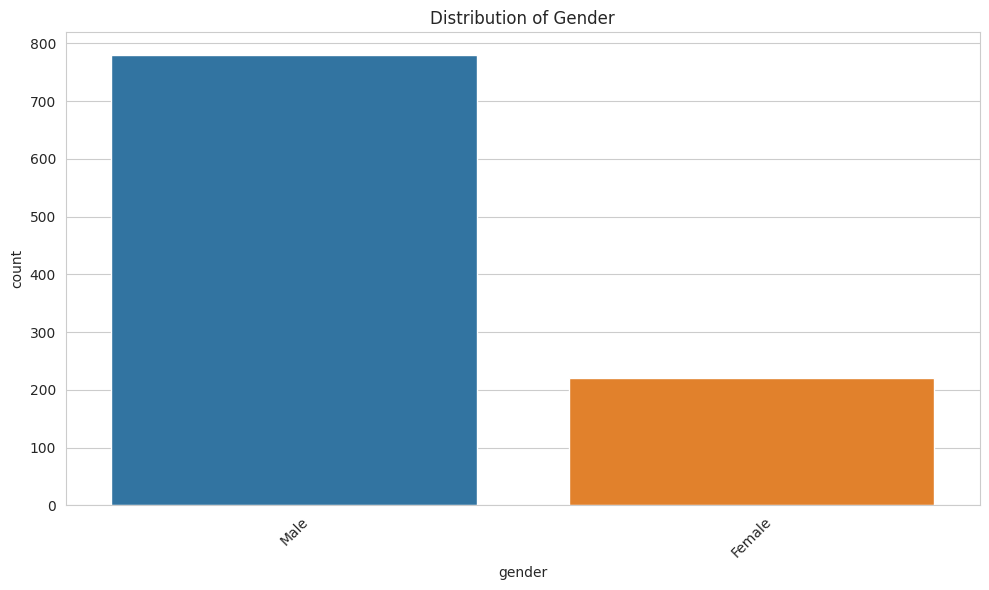

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



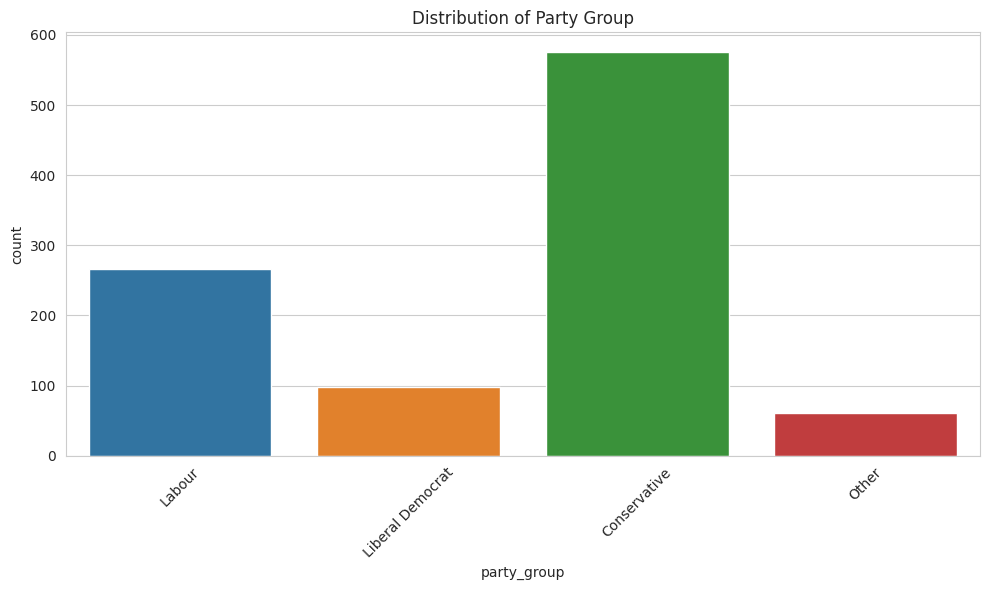

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



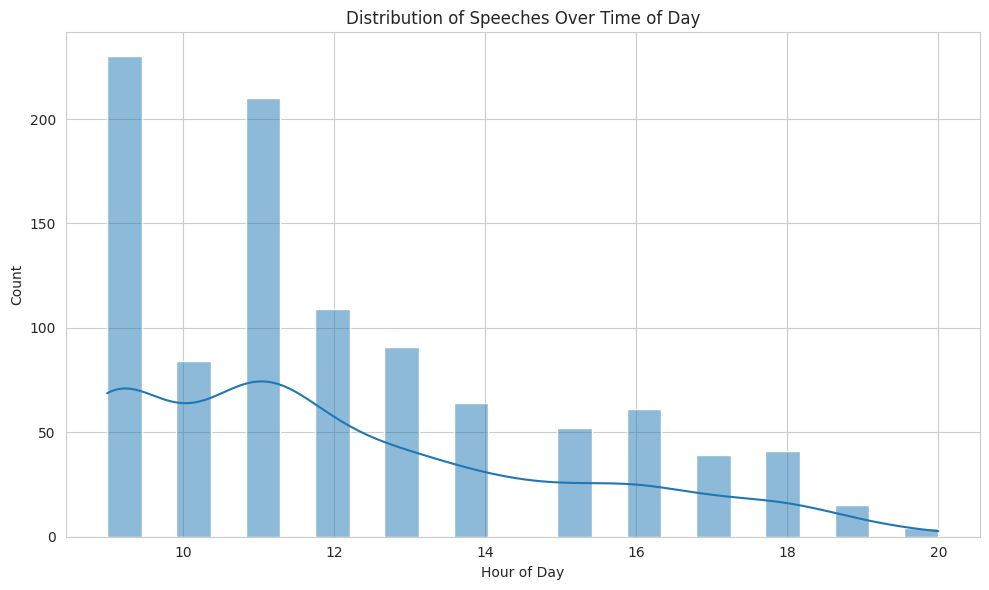

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



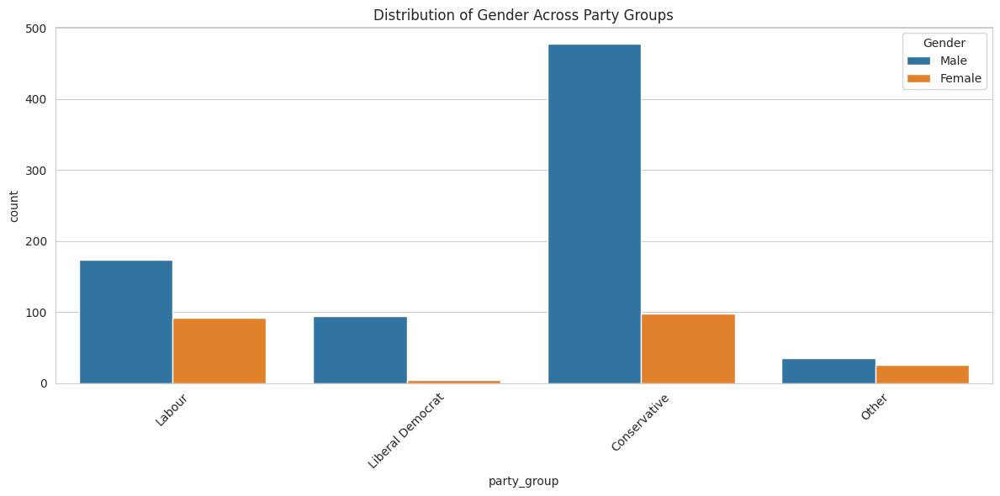

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be remove

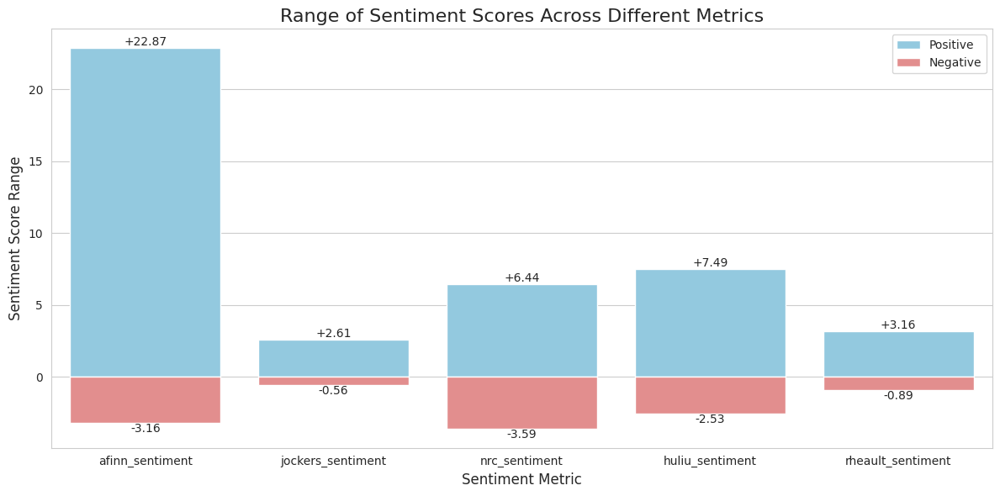

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be remove

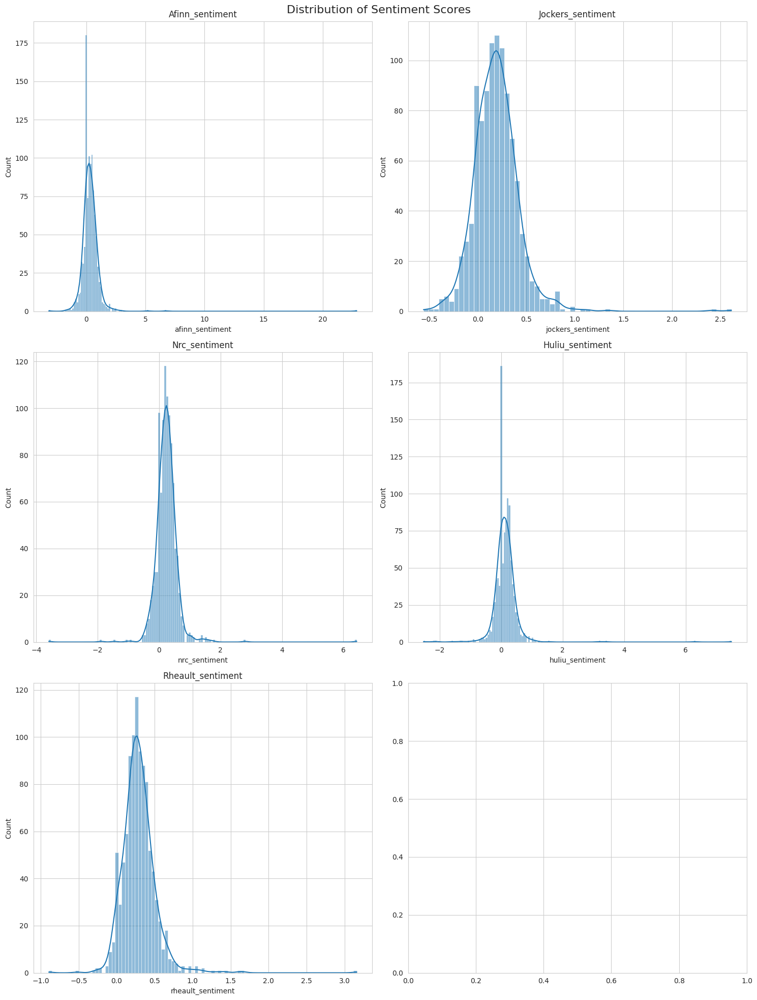

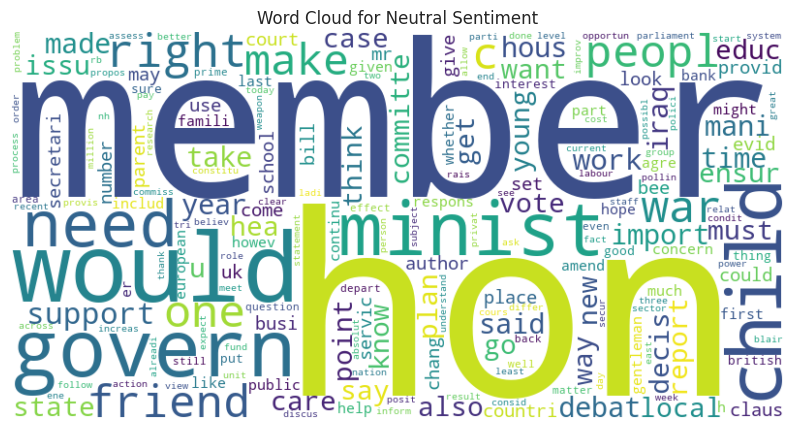

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



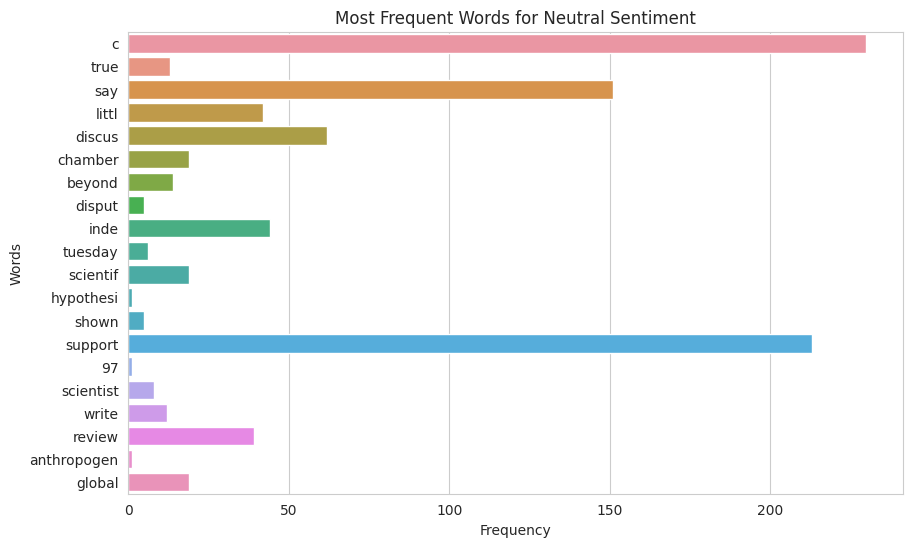

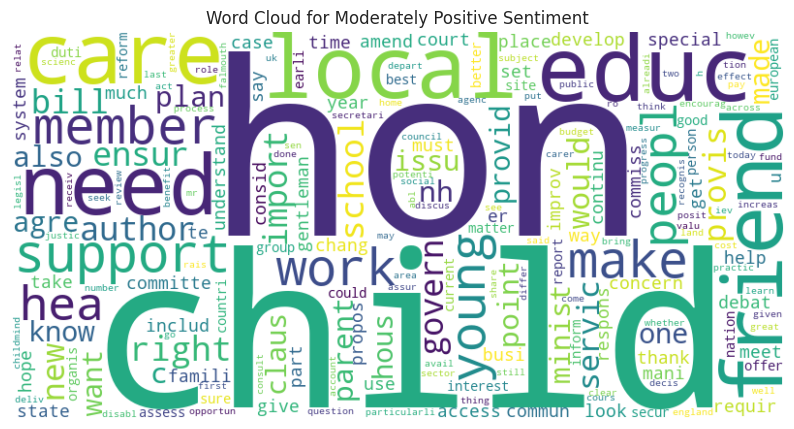

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



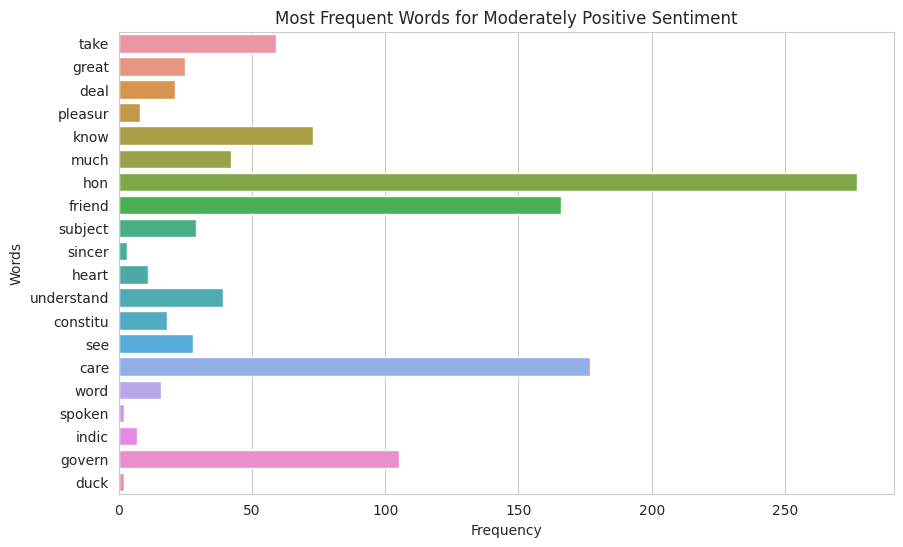

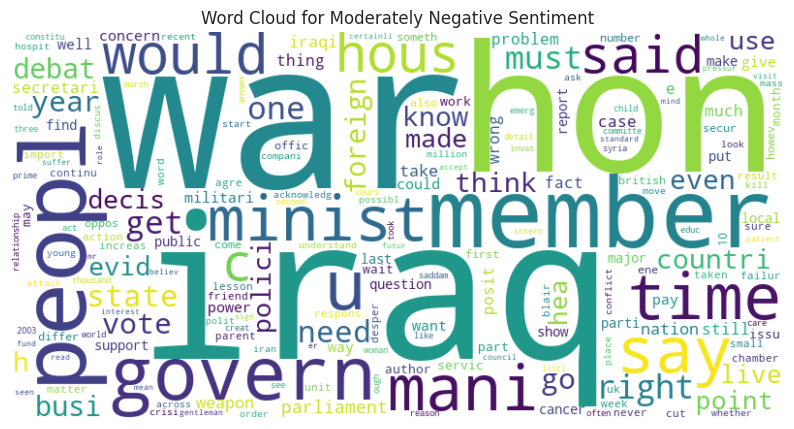

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



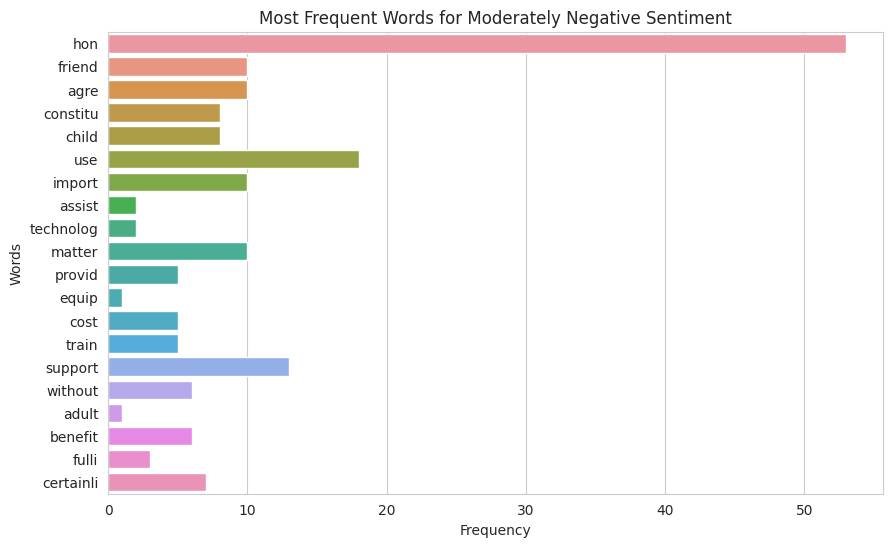

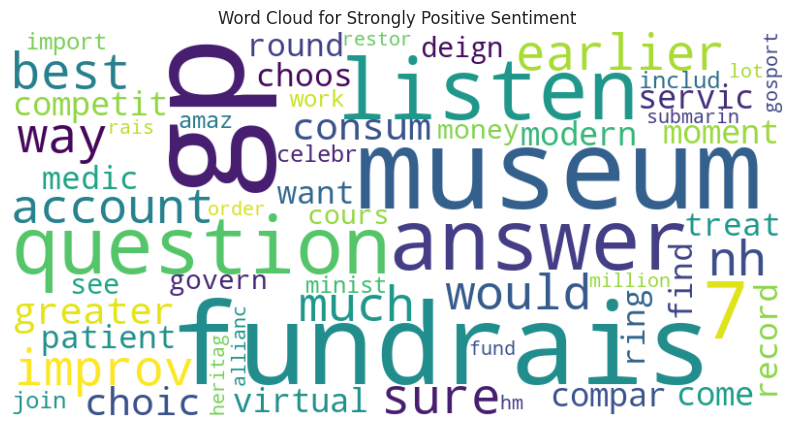

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



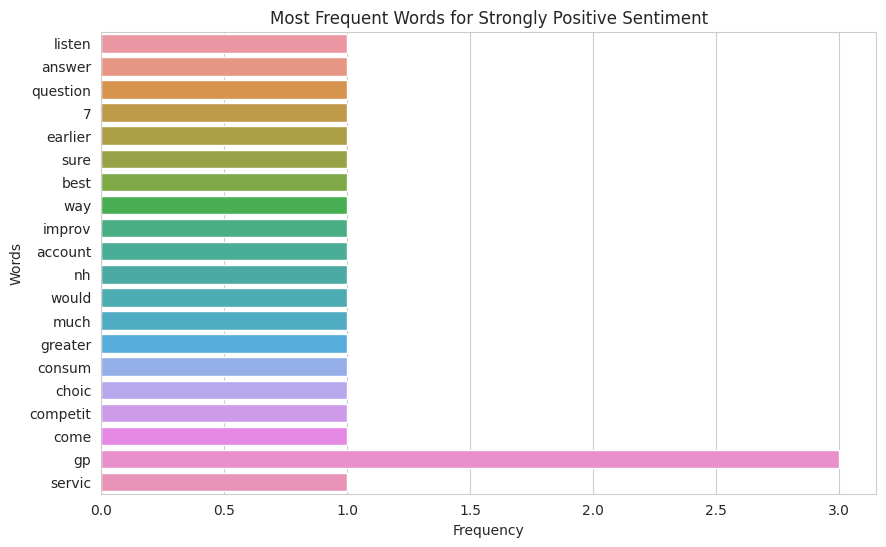

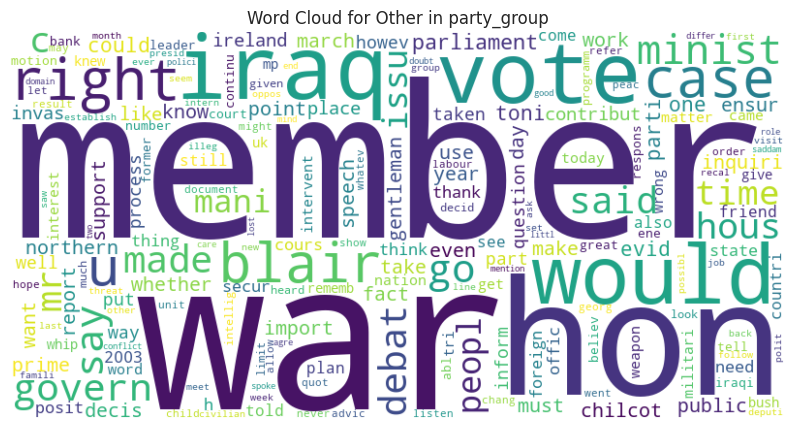

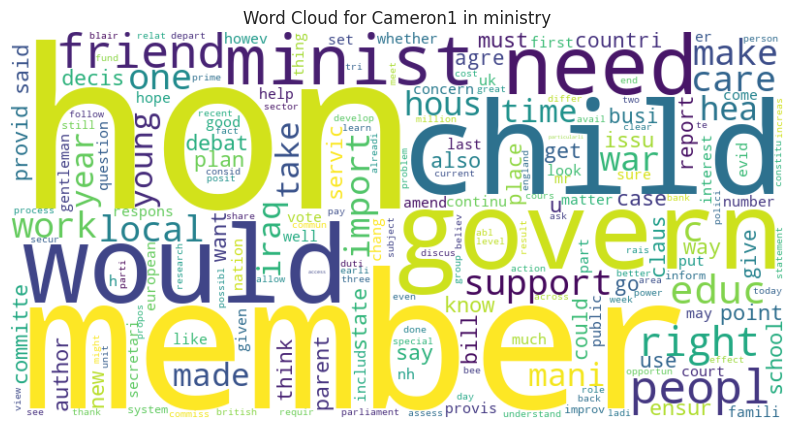

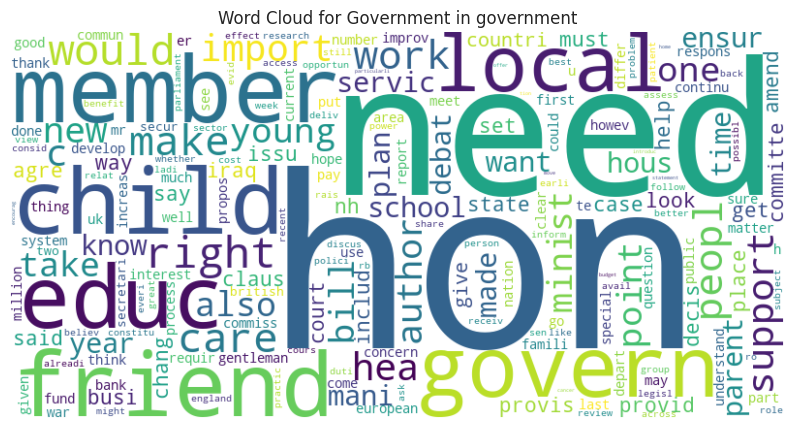

Exception ignored on calling ctypes callback function: <function ThreadpoolController._find_libraries_with_dl_iterate_phdr.<locals>.match_library_callback at 0x7a0ff660dea0>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/threadpoolctl.py", line 1005, in match_library_callback
    self._make_controller_from_path(filepath)
  File "/opt/conda/lib/python3.10/site-packages/threadpoolctl.py", line 1175, in _make_controller_from_path
    lib_controller = controller_class(
  File "/opt/conda/lib/python3.10/site-packages/threadpoolctl.py", line 114, in __init__
    self.dynlib = ctypes.CDLL(filepath, mode=_RTLD_NOLOAD)
  File "/opt/conda/lib/python3.10/ctypes/__init__.py", line 374, in __init__
    self._handle = _dlopen(self._name, mode)
OSError: /opt/conda/lib/python3.10/site-packages/scipy.libs/libscipy_openblas-c128ec02.so: cannot open shared object file: No such file or directory


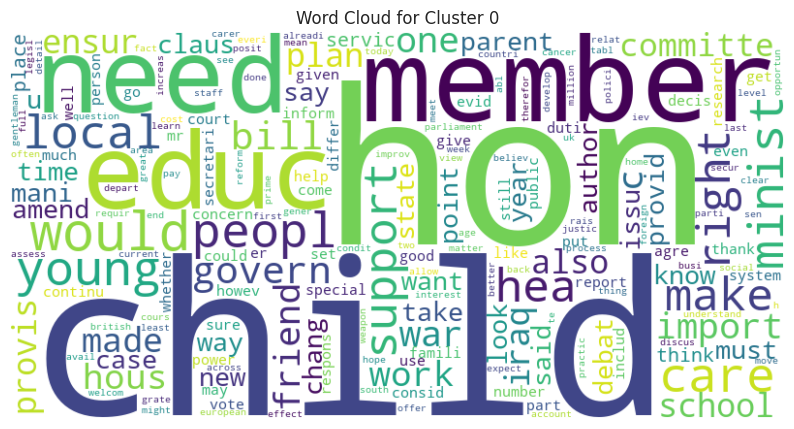

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



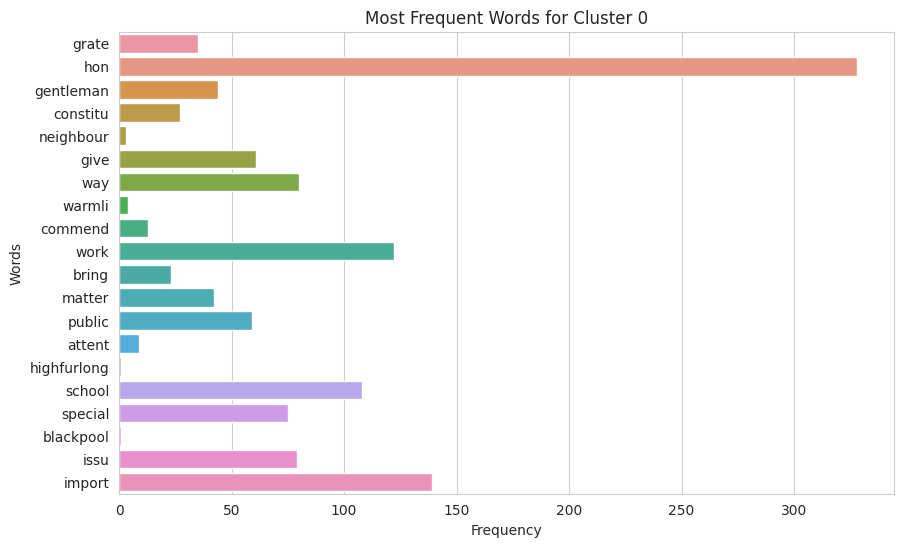

/opt/conda/lib/python3.10/site-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning:

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



Cluster 0 Analysis
   cluster  average_sentiment  speech_count
0        0            0.22249           293
Topics in Cluster 0:


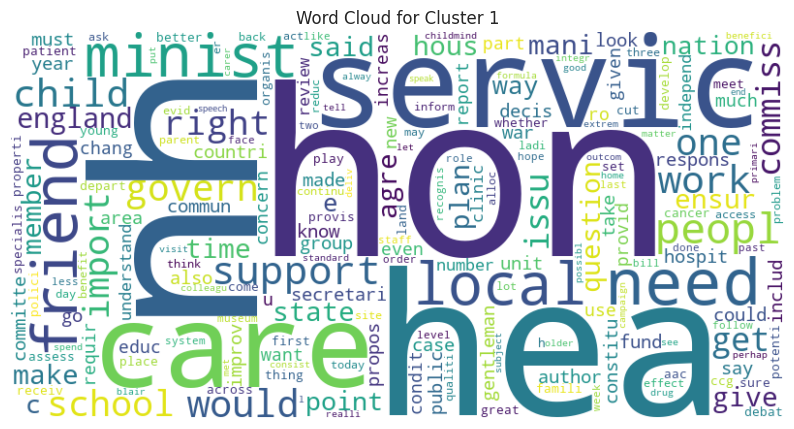

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



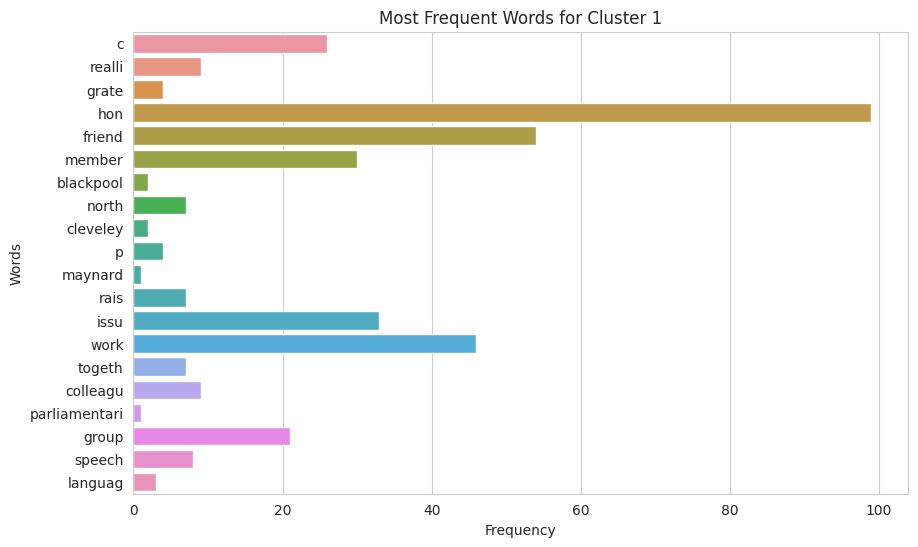

Cluster 1 Analysis
   cluster  average_sentiment  speech_count
0        1           0.108104           161
Topics in Cluster 1:


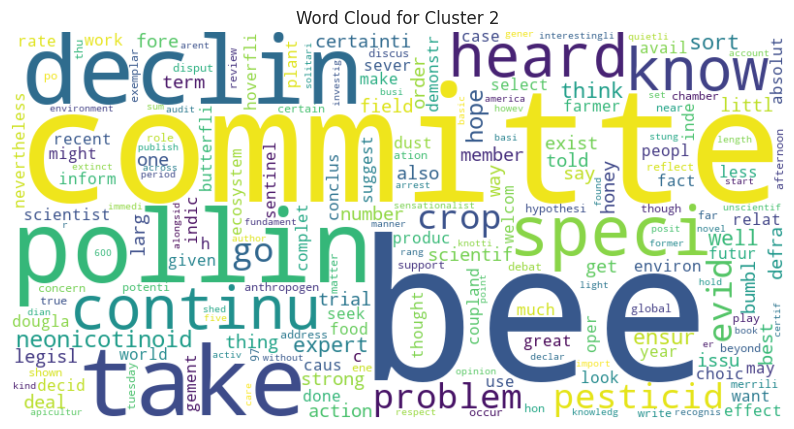

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



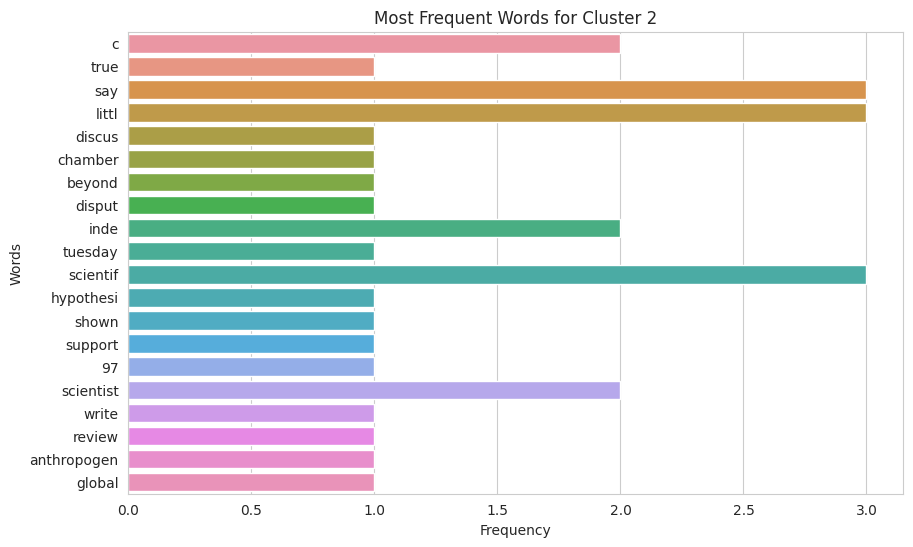

Cluster 2 Analysis
   cluster  average_sentiment  speech_count
0        2          -0.344912             1
Topics in Cluster 2:


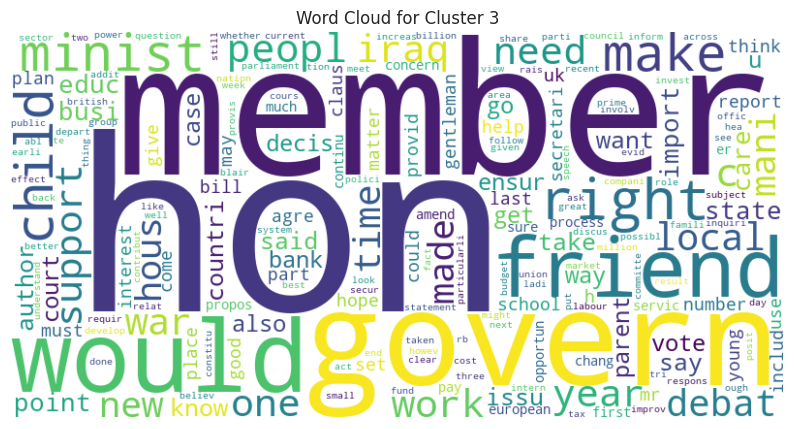

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



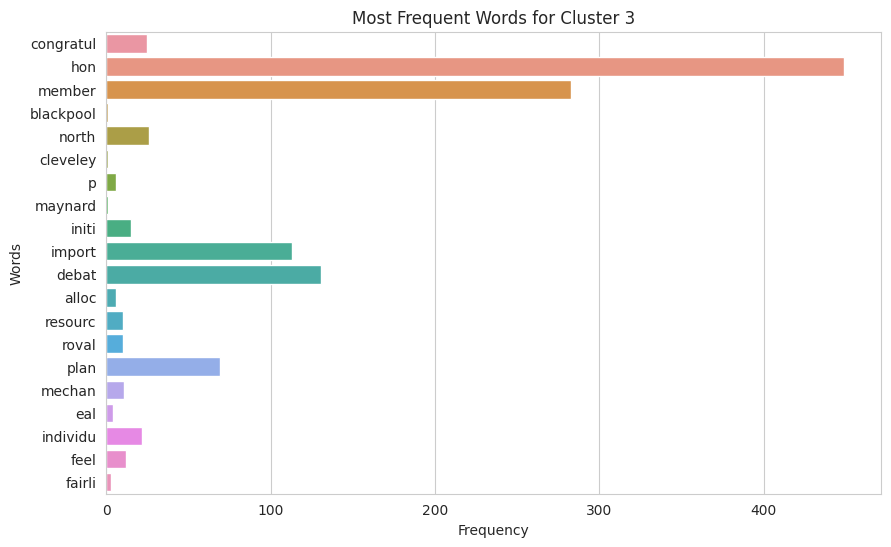

Cluster 3 Analysis
   cluster  average_sentiment  speech_count
0        3           0.170882           471
Topics in Cluster 3:


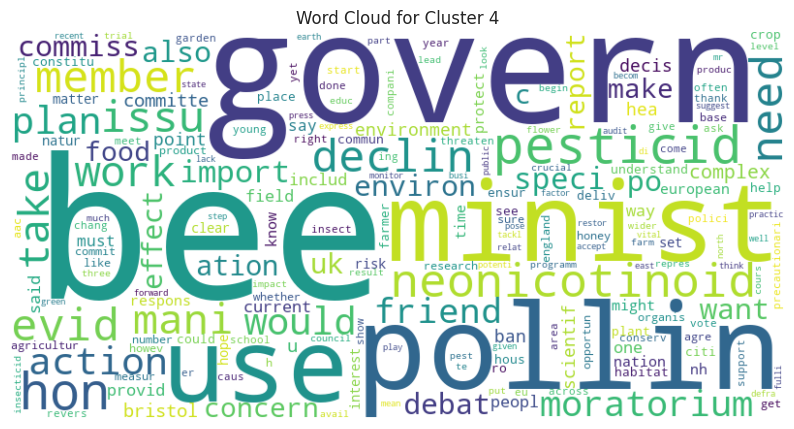

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



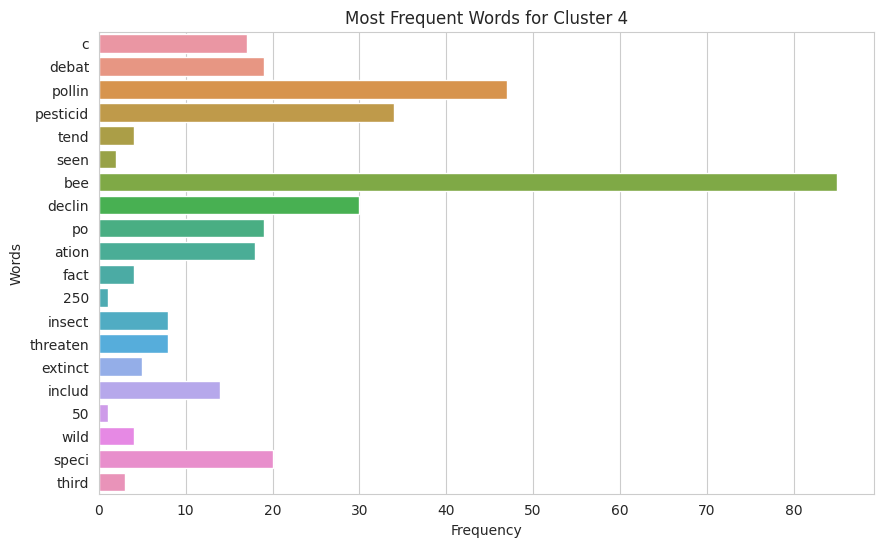

Cluster 4 Analysis
   cluster  average_sentiment  speech_count
0        4           0.025077            26
Topics in Cluster 4:

DataFrame for cluster_0_df:
   cluster  average_sentiment  speech_count
0        0            0.22249           293

DataFrame for cluster_1_df:
   cluster  average_sentiment  speech_count
0        1           0.108104           161

DataFrame for cluster_2_df:
   cluster  average_sentiment  speech_count
0        2          -0.344912             1

DataFrame for cluster_3_df:
   cluster  average_sentiment  speech_count
0        3           0.170882           471

DataFrame for cluster_4_df:
   cluster  average_sentiment  speech_count
0        4           0.025077            26

Combined DataFrame:


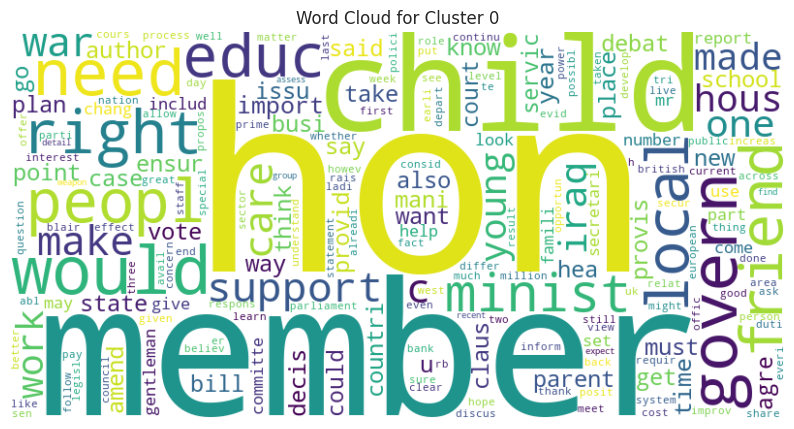

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



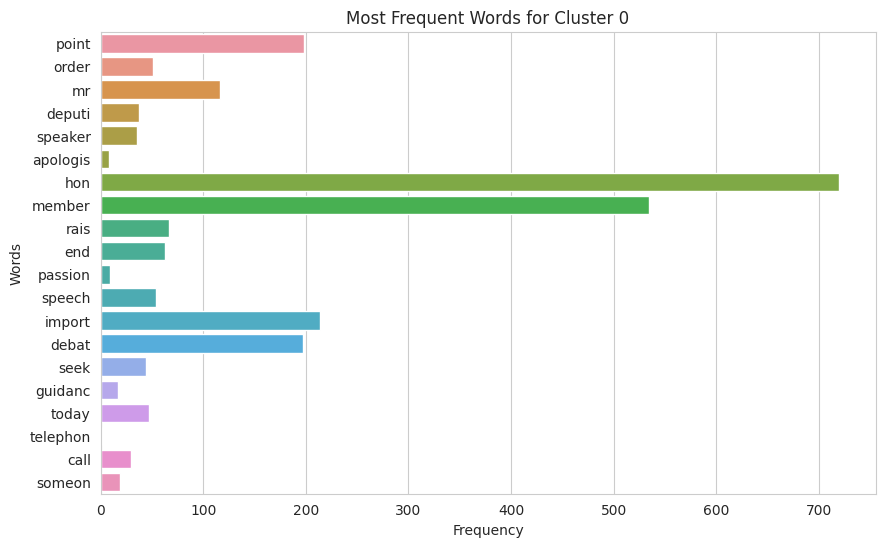

Cluster 0 Analysis
   cluster  average_sentiment  speech_count
0        0           0.173101           683
Topics in Cluster 0:


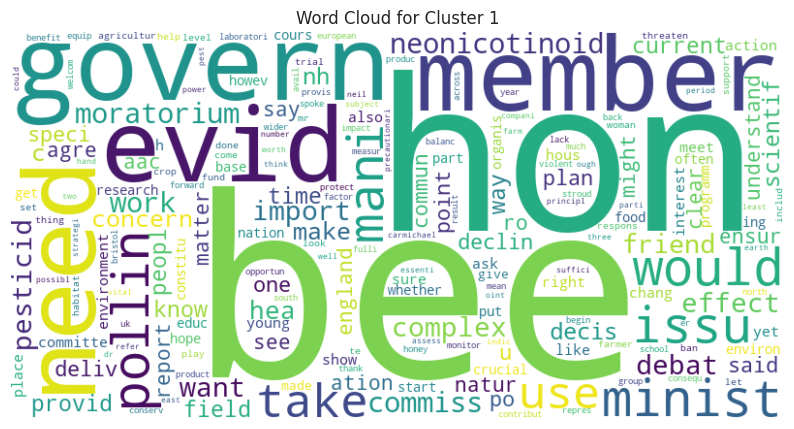

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



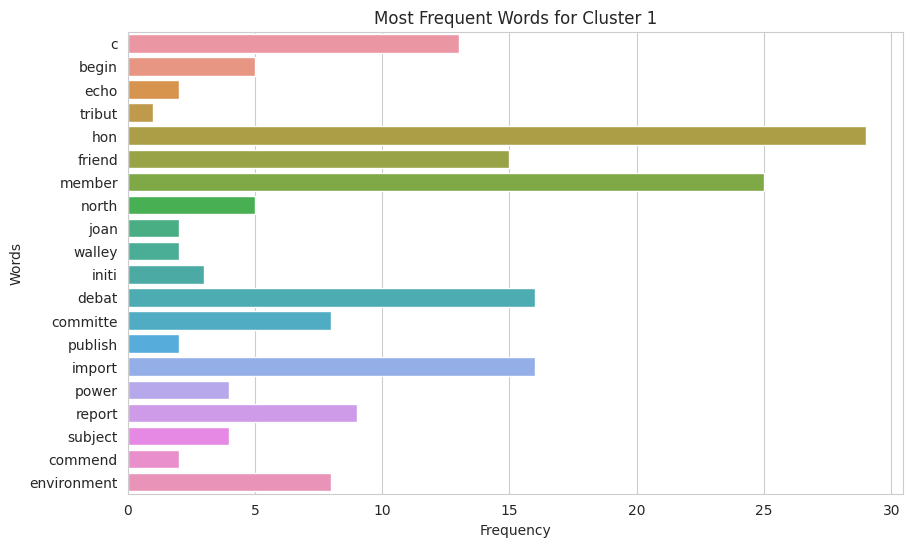

Cluster 1 Analysis
   cluster  average_sentiment  speech_count
0        1           0.004913            20
Topics in Cluster 1:


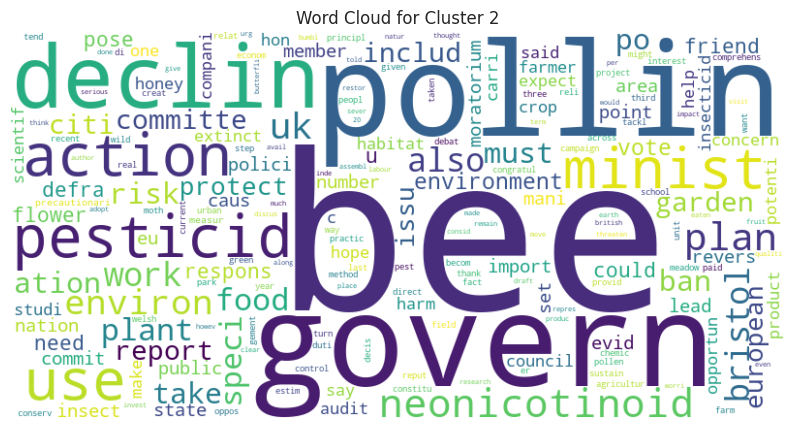

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



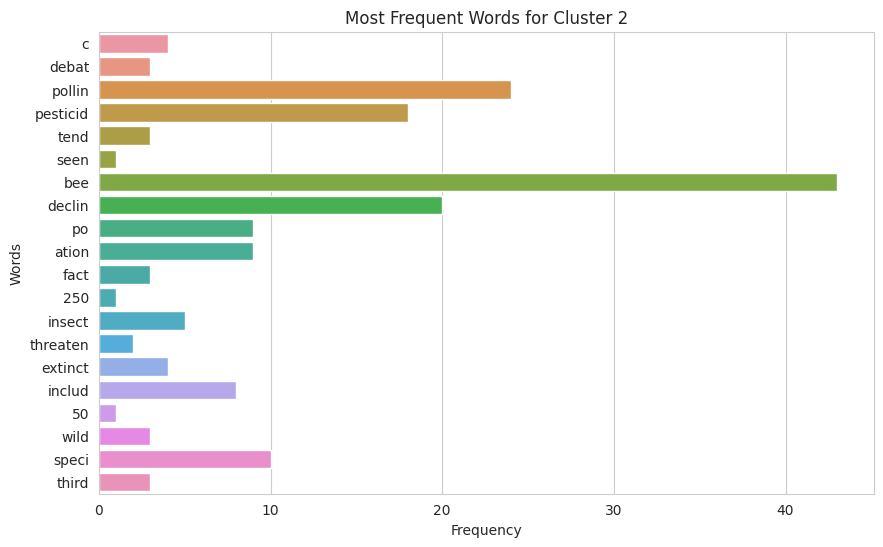

Cluster 2 Analysis
   cluster  average_sentiment  speech_count
0        2            0.09229             6
Topics in Cluster 2:


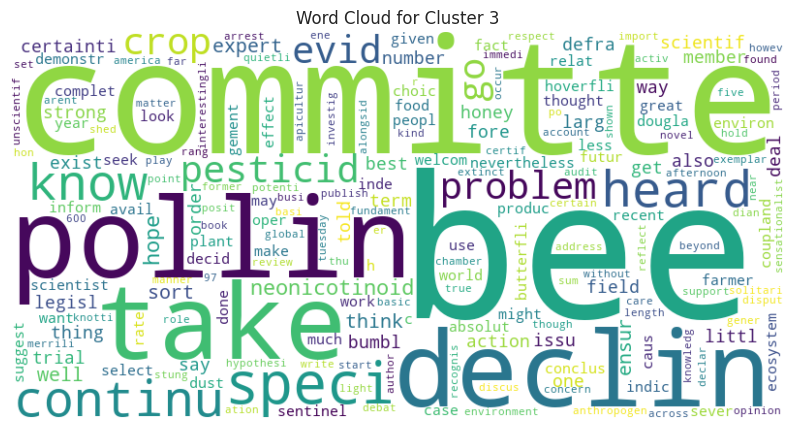

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



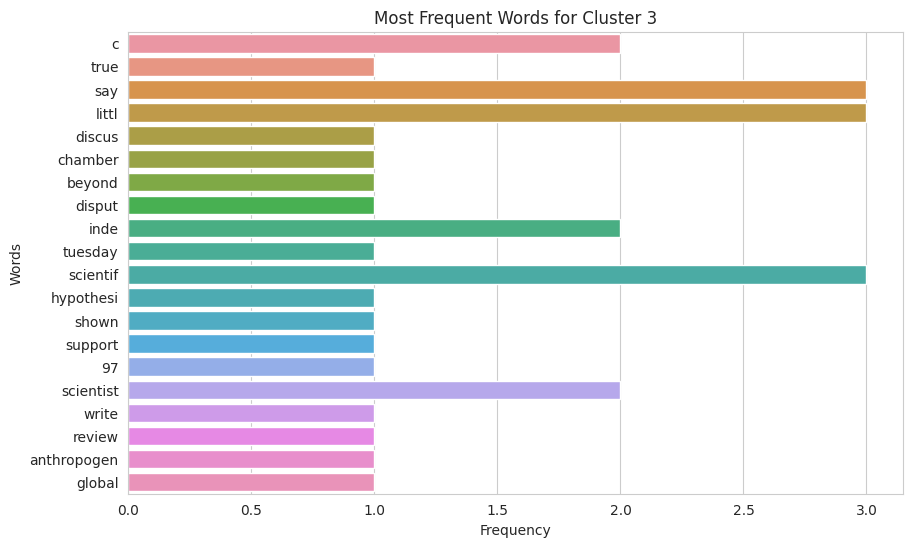

Cluster 3 Analysis
   cluster  average_sentiment  speech_count
0        3          -0.344912             1
Topics in Cluster 3:


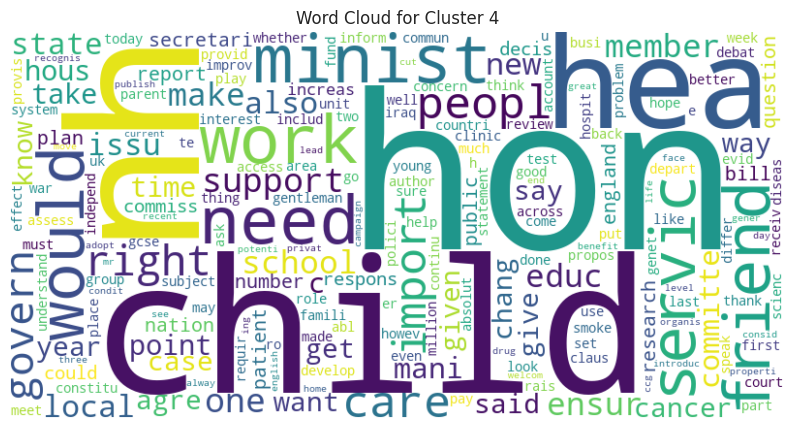

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



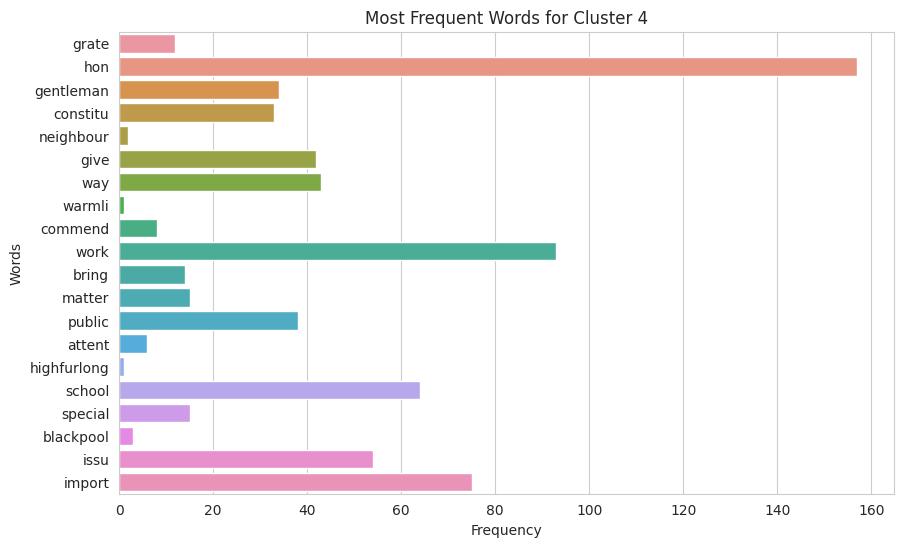

Cluster 4 Analysis
   cluster  average_sentiment  speech_count
0        4           0.185338           242
Topics in Cluster 4:

DataFrame for cluster_0_df:
   cluster  average_sentiment  speech_count
0        0           0.173101           683

DataFrame for cluster_1_df:
   cluster  average_sentiment  speech_count
0        1           0.004913            20

DataFrame for cluster_2_df:
   cluster  average_sentiment  speech_count
0        2            0.09229             6

DataFrame for cluster_3_df:
   cluster  average_sentiment  speech_count
0        3          -0.344912             1

DataFrame for cluster_4_df:
   cluster  average_sentiment  speech_count
0        4           0.185338           242

Combined DataFrame:


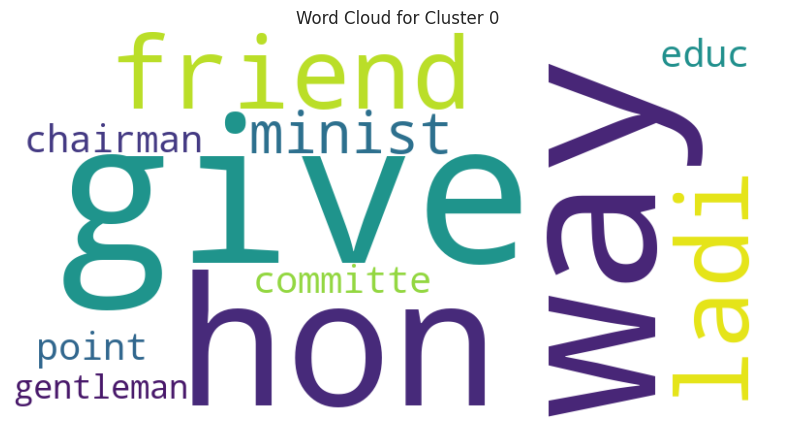

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



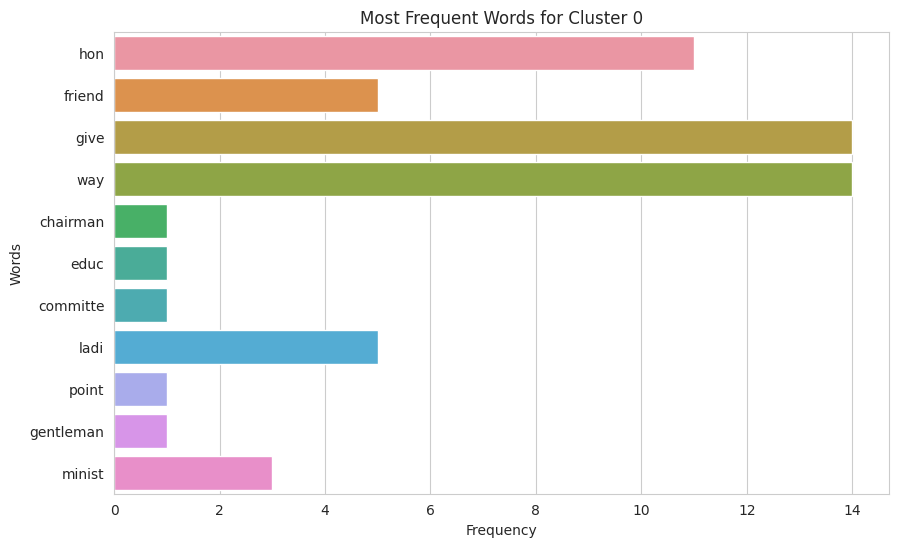

Cluster 0 Analysis
   cluster  average_sentiment  speech_count
0        0           0.046357            14
Topics in Cluster 0:


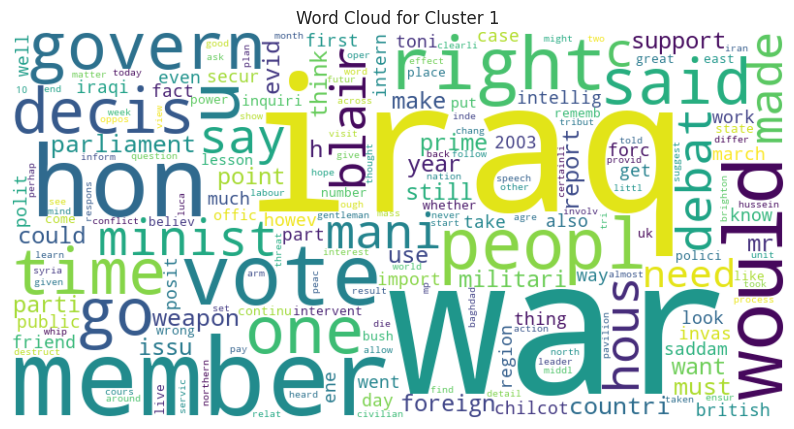

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



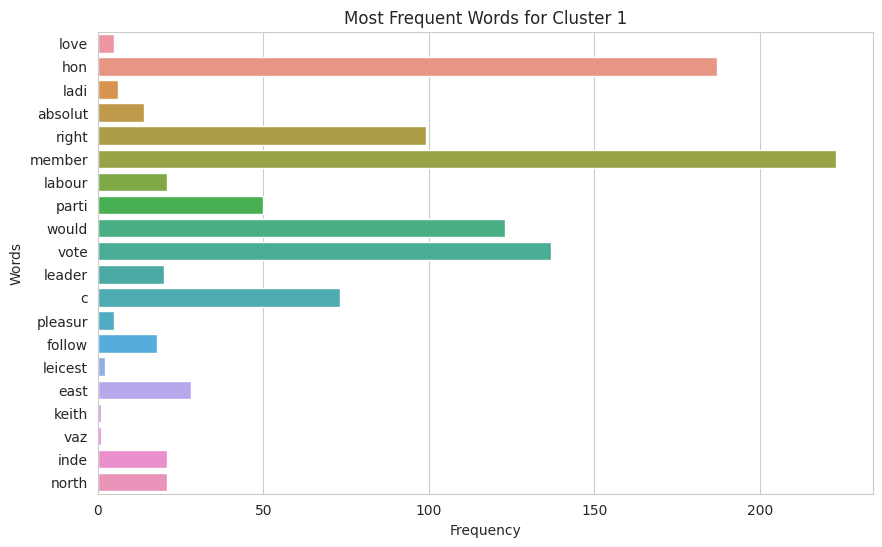

Cluster 1 Analysis
   cluster  average_sentiment  speech_count
0        1          -0.332749            80
Topics in Cluster 1:


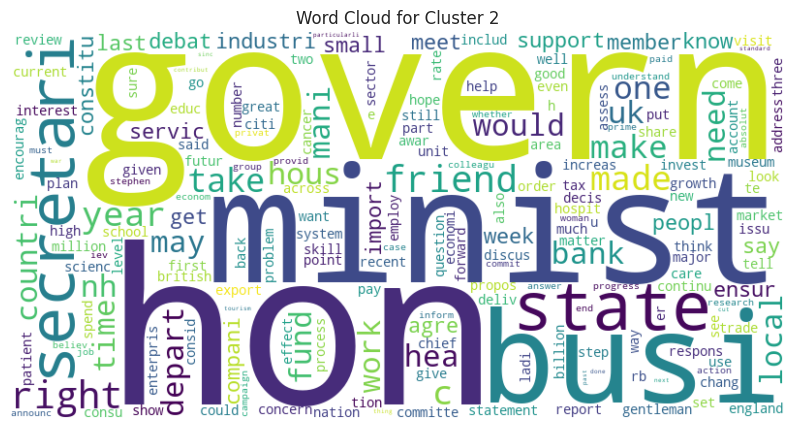

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



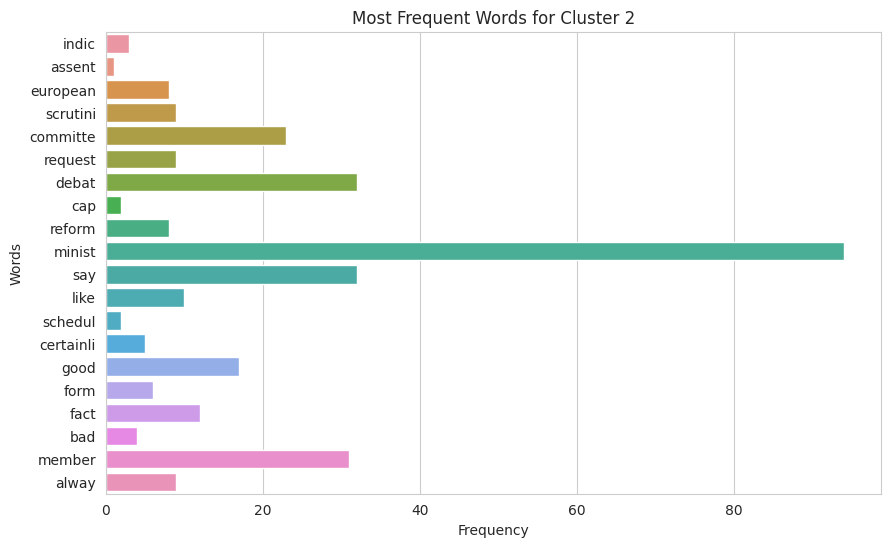

Cluster 2 Analysis
   cluster  average_sentiment  speech_count
0        2           0.094469           485
Topics in Cluster 2:


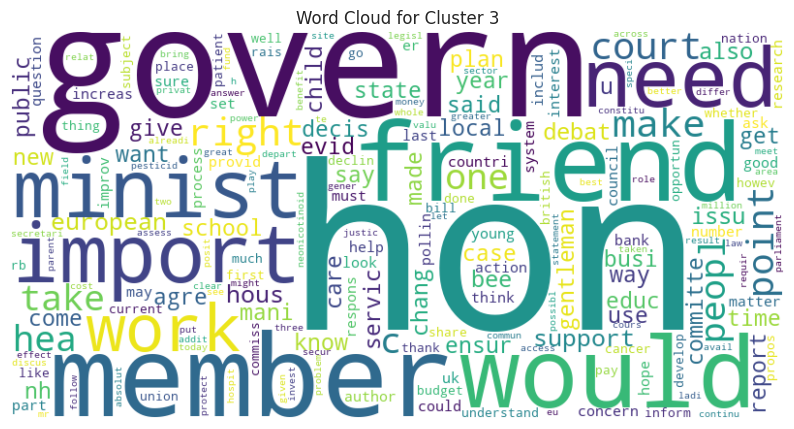

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



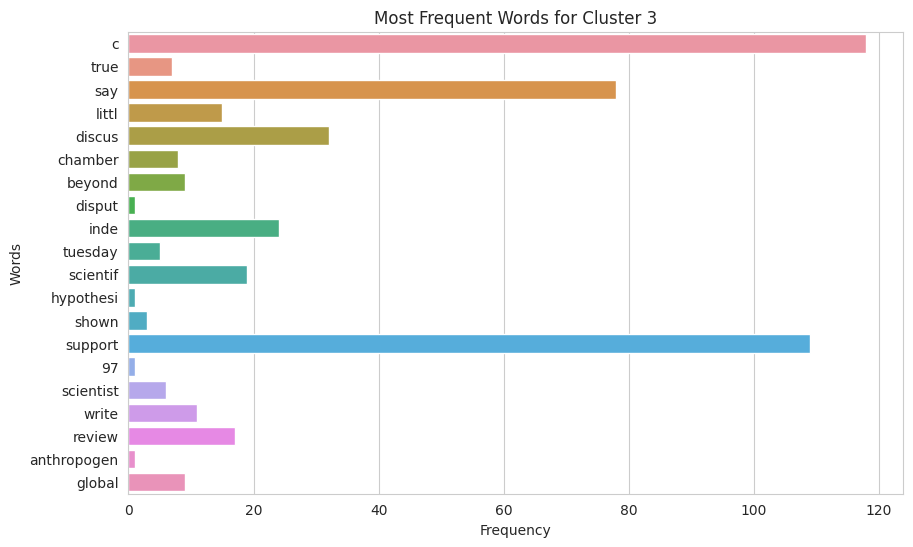

Cluster 3 Analysis
   cluster  average_sentiment  speech_count
0        3           0.360559           304
Topics in Cluster 3:


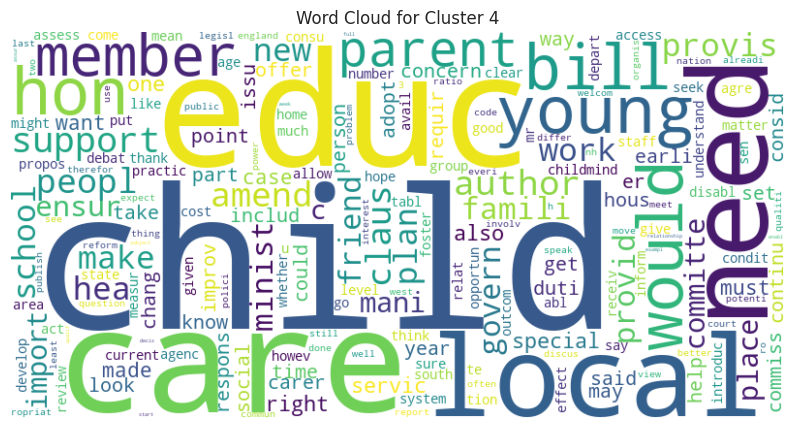

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



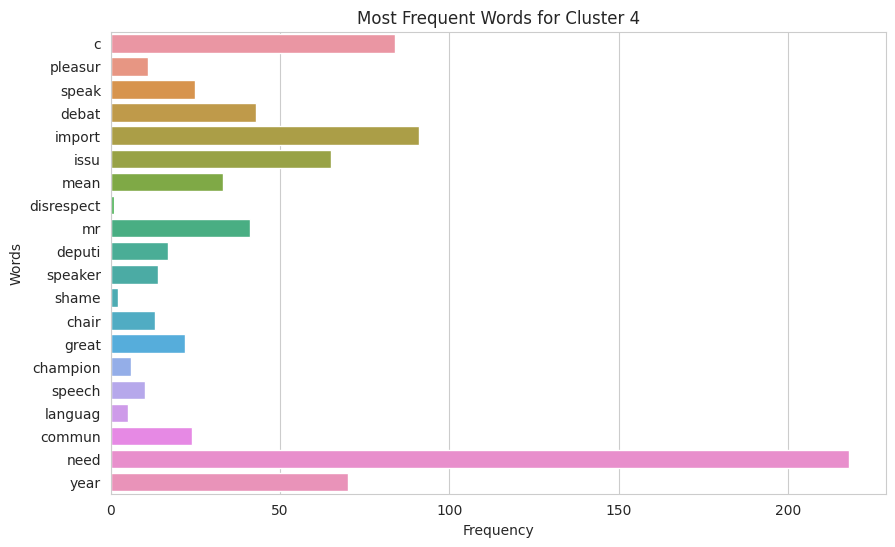

Cluster 4 Analysis
   cluster  average_sentiment  speech_count
0        4           0.491743            69
Topics in Cluster 4:

DataFrame for cluster_0_df:
   cluster  average_sentiment  speech_count
0        0           0.046357            14

DataFrame for cluster_1_df:
   cluster  average_sentiment  speech_count
0        1          -0.332749            80

DataFrame for cluster_2_df:
   cluster  average_sentiment  speech_count
0        2           0.094469           485

DataFrame for cluster_3_df:
   cluster  average_sentiment  speech_count
0        3           0.360559           304

DataFrame for cluster_4_df:
   cluster  average_sentiment  speech_count
0        4           0.491743            69

Combined DataFrame:


,cluster,average_sentiment,speech_count
0,0,0.046357,14
1,1,-0.332749,80
2,2,0.094469,485
3,3,0.360559,304
4,4,0.491743,69


In [63]:
stats_summary = pd.read_csv('/kaggle/input/hansard-dataset/summary_stats.csv', index_col='Unnamed: 0') # /kaggle/input/oulu-university/summary_stats.csv
stats_summary
# Load the dataset
sample = pd.read_csv('/kaggle/input/hansard-dataset/Hansard Dataset/sample_2001.csv') # /kaggle/input/oulu-university/hansard_senti_post_csv_03/sample_2001.csv
sample.iloc[0]
# Example DataFrame
remove_words_list = ['c']

sample['speech_processed'] = sample['speech'].progress_apply(preprocess_text) # Apply preprocessing function to the 'speech' column using progress_apply
sample['len_speech_processed'] = sample['speech_processed'].progress_apply(len) # Calculate the lengths of the processed speech
sample['speech_processed_final'] = sample['speech_processed'].progress_apply(lambda x: preprocessing_remove(x, remove_words_list)) # Apply preprocessing_remove function to the 'speech_processed' column using progress_apply
sample['len_speech_processed_final'] = sample['speech_processed_final'].apply(len) # Calculate the lengths of the final processed speech
sample

# Print summary statistics
print_summary_statistics(sample)
plot_categorical_distribution(sample, 'gender', 'Gender')
plot_categorical_distribution(sample, 'party_group', 'Party Group')
plot_time_distribution(sample)
plot_gender_party_distribution(sample)
sentiment_columns = ['afinn_sentiment', 'jockers_sentiment', 'nrc_sentiment', 'huliu_sentiment', 'rheault_sentiment']
df_range = sentiment_analysis_range(sample, sentiment_columns)
df_range

plot_sentiment_distribution(sample)

# Convert stats_summary to dictionaries for easy access
means = stats_summary.loc['mean'].to_dict()
stds = stats_summary.loc['std'].to_dict()

# Define the sentiment columns
sentiment_columns = ['afinn_sentiment', 'jockers_sentiment', 'nrc_sentiment', 'huliu_sentiment', 'rheault_sentiment']

# Step 1: Identify and Eliminate Outliers

outliers = identify_outliers(sample, sentiment_columns)
sample = sample[~outliers] # take note the 

# Step 2: Apply Z-Normalization
sample = normalized_sentiment(sample, sentiment_columns, means, stds)

# Step 3: Define equal weights for the weighted normalization
weights = [1 / len(sentiment_columns)] * len(sentiment_columns)  # Equal weights

# Step 4: Apply Weighted Normalization
sample = weighted_normalized_sentiment(sample, sentiment_columns, weights)

# Step 5: Apply Categorization to the calculated weighted normalized sentiment
sample['sentiment_category'] = sample['average_sentiment'].apply(categorize_sentiment)

sentiment_categories = sample['sentiment_category'].unique()
for category in sentiment_categories:
    word_freq = most_frequent_words(category)
    plot_wordcloud(word_freq, f'Word Cloud for {category} Sentiment')
    plot_barchart(word_freq, f'Most Frequent Words for {category} Sentiment')
    
cross_category_analysis('party_group')
cross_category_analysis('ministry')
cross_category_analysis('government')

tfidf_similarity_matrix = tfidf_similarity(sample)
demographic_similarity_matrix = demographic_similarity(sample)
doc2vec_similarity_matrix = doc2vec_similarity(sample)

# Clustering based on text data (replace tfidf_similarity_matrix with doc2vec_similarity_matrix if available)
text_clusters_kmeans = perform_clustering(tfidf_similarity_matrix)
text_clusters_dbscan = apply_dbscan(tfidf_similarity_matrix)
text_clusters_agglomerative = apply_agglomerative_clustering(tfidf_similarity_matrix)

# Clustering based on demographic data
demographic_clusters_kmeans = perform_clustering(demographic_similarity_matrix)
demographic_clusters_dbscan = apply_dbscan(demographic_similarity_matrix)
demographic_clusters_agglomerative = apply_agglomerative_clustering(demographic_similarity_matrix)

# Create a DataFrame
df_clusters = pd.DataFrame({
    'Demographic Cluster KMeans': demographic_clusters_kmeans,
    'Demographic Cluster Agglomerative': demographic_clusters_agglomerative,
    'Text Cluster KMeans': text_clusters_kmeans,
    'Text Cluster Agglomerative': text_clusters_agglomerative
})

# Analyze clusters and get topics DataFrame
topics_df, cluster_dfs, combined_df = analyze_clusters(demographic_clusters_kmeans, sample)

# Displaying the content of each cluster DataFrame
for cluster, df in cluster_dfs.items():
    print(f'\nDataFrame for {cluster}:')
    print(df)

# Displaying the combined DataFrame
print('\nCombined DataFrame:')
combined_df

# Analyze clusters and get topics DataFrame
topics_df, cluster_dfs, combined_df = analyze_clusters(demographic_clusters_agglomerative, sample)

# Displaying the content of each cluster DataFrame
for cluster, df in cluster_dfs.items():
    print(f'\nDataFrame for {cluster}:')
    print(df)

# Displaying the combined DataFrame
print('\nCombined DataFrame:')
combined_df

# Analyze clusters and get topics DataFrame
topics_df, cluster_dfs, combined_df = analyze_clusters(text_clusters_kmeans, sample)

# Displaying the content of each cluster DataFrame
for cluster, df in cluster_dfs.items():
    print(f'\nDataFrame for {cluster}:')
    print(df)

# Displaying the combined DataFrame
print('\nCombined DataFrame:')
combined_df

# # Analyze clusters and get topics DataFrame
# topics_df, cluster_dfs, combined_df = analyze_clusters(text_clusters_agglomerative, sample)

# # Displaying the content of each cluster DataFrame
# for cluster, df in cluster_dfs.items():
#     print(f'\nDataFrame for {cluster}:')
#     print(df)

# # Displaying the combined DataFrame
# print('\nCombined DataFrame:')
# combined_df

Categorical Columns in Correlation Features:
DataFrame after One-Hot Encoding:

One-Hot Encoded Columns:


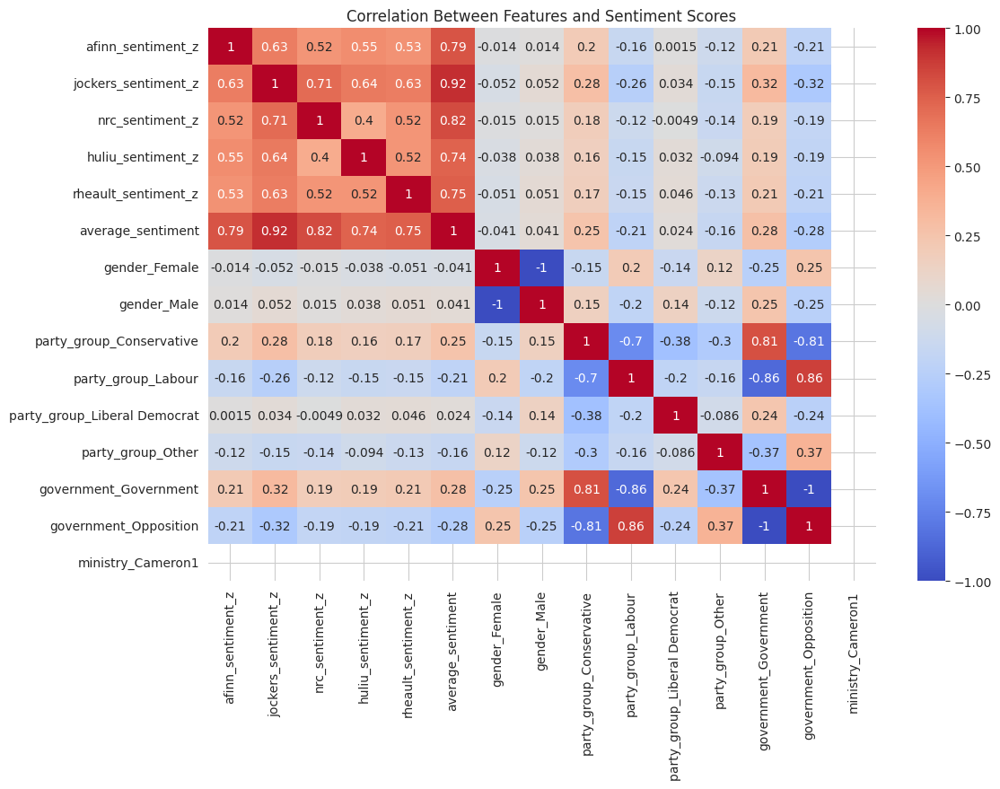

Correlation Matrix:



,afinn_sentiment_z,jockers_sentiment_z,nrc_sentiment_z,huliu_sentiment_z,rheault_sentiment_z,average_sentiment,gender_Female,gender_Male,party_group_Conservative,party_group_Labour,party_group_Liberal Democrat,party_group_Other,government_Government,government_Opposition,ministry_Cameron1
afinn_sentiment_z,1.000000,0.630559,0.520916,0.554695,0.533245,0.791668,-0.014331,0.014331,0.195706,-0.156075,0.001457,-0.115455,0.206569,-0.206569,NaN
jockers_sentiment_z,0.630559,1.000000,0.705490,0.642264,0.632656,0.917468,-0.052406,0.052406,0.283022,-0.257063,0.034239,-0.149249,0.319152,-0.319152,NaN
nrc_sentiment_z,0.520916,0.705490,1.000000,0.400615,0.517730,0.821819,-0.014706,0.014706,0.179273,-0.118211,-0.004941,-0.143307,0.185236,-0.185236,NaN
huliu_sentiment_z,0.554695,0.642264,0.400615,1.000000,0.521195,0.735890,-0.038249,0.038249,0.163566,-0.152605,0.031881,-0.093779,0.192131,-0.192131,NaN
rheault_sentiment_z,0.533245,0.632656,0.517730,0.521195,1.000000,0.751215,-0.050681,0.050681,0.167744,-0.146089,0.046440,-0.132173,0.205773,-0.205773,NaN
average_sentiment,0.791668,0.917468,0.821819,0.735890,0.751215,1.000000,-0.040507,0.040507,0.252166,-0.209953,0.023548,-0.159302,0.279935,-0.279935,NaN
gender_Female,-0.014331,-0.052406,-0.014706,-0.038249,-0.050681,-0.040507,1.000000,-1.000000,-0.150185,0.196166,-0.142716,0.123513,-0.248502,0.248502,NaN
gender_Male,0.014331,0.052406,0.014706,0.038249,0.050681,0.040507,-1.000000,1.000000,0.150185,-0.196166,0.142716,-0.123513,0.248502,-0.248502,NaN
party_group_Conservative,0.195706,0.283022,0.179273,0.163566,0.167744,0.252166,-0.150185,0.150185,1.000000,-0.696545,-0.380356,-0.296287,0.809074,-0.809074,NaN
party_group_Labour,-0.156075,-0.257063,-0.118211,-0.152605,-0.146089,-0.209953,0.196166,-0.196166,-0.696545,1.000000,-0.203003,-0.158133,-0.860917,0.860917,NaN


In [64]:
correlation_features = ['gender', 'party_group', 'ministry', 'government']
categorical_in_corr_features = list(set(correlation_features)) #  & set(categorical_columns)
print("Categorical Columns in Correlation Features:")
categorical_in_corr_features

df_encoded = apply_one_hot_encoding(sample, categorical_in_corr_features)
print("DataFrame after One-Hot Encoding:\n")
df_encoded.head()

one_hot_encoded_columns = [col for col in df_encoded.columns if col not in sample.columns]
print("One-Hot Encoded Columns:")
one_hot_encoded_columns

correlation_matrix = calculate_correlation(df_encoded)
print("Correlation Matrix:\n")
correlation_matrix

Topic 1:


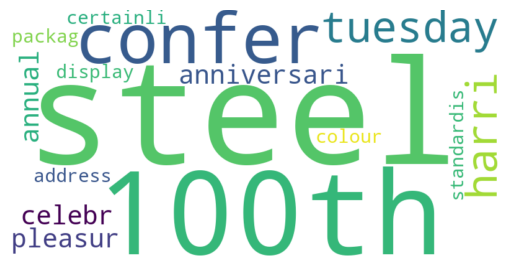

Topic 2:


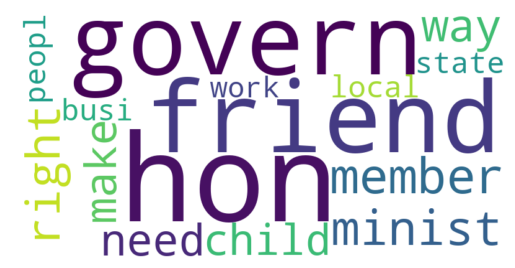

Topic 3:


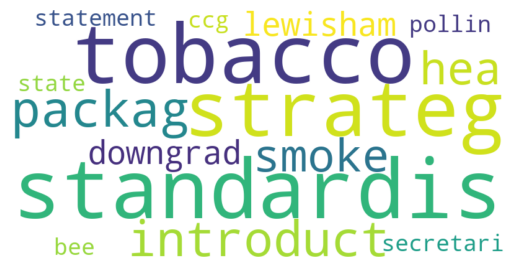

Topic 4:


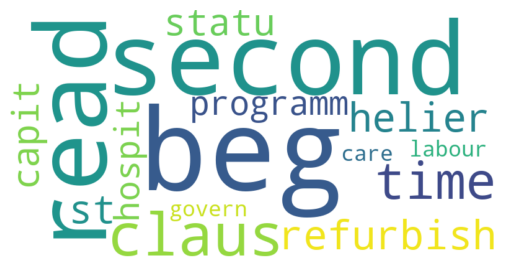

Topic 5:


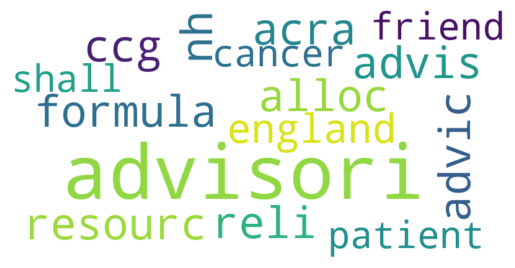

Topic 6:


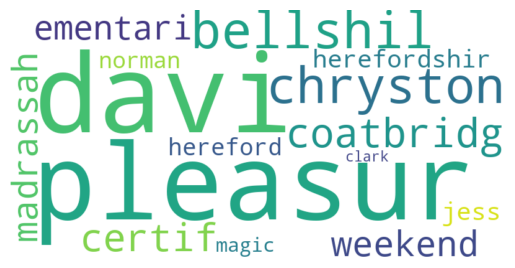

Topic 7:


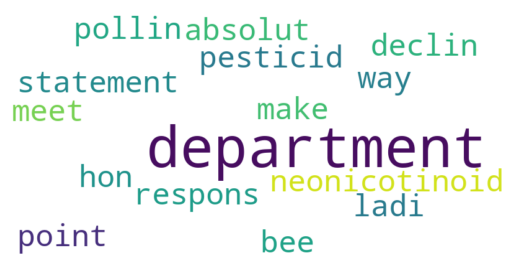

Topic 8:


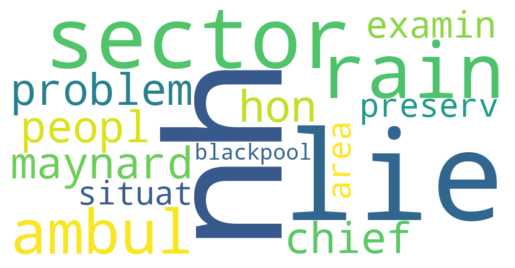

Topic 9:


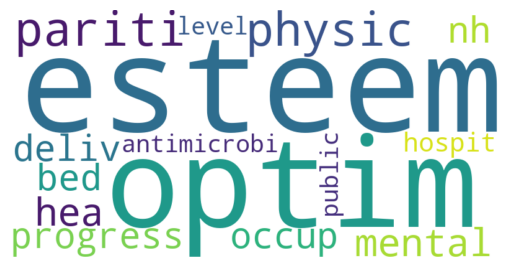

Topic 10:


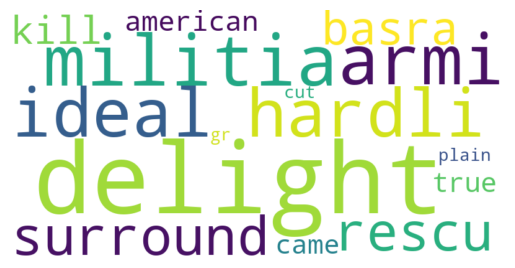

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



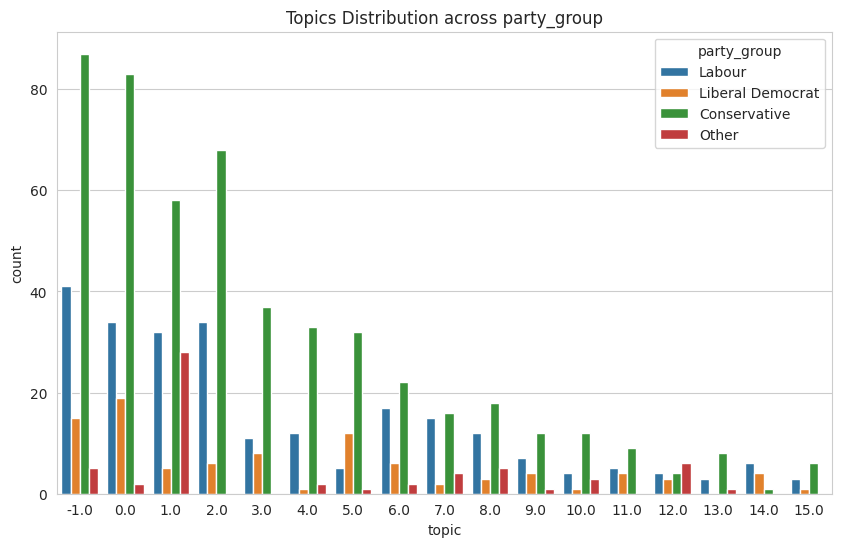

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



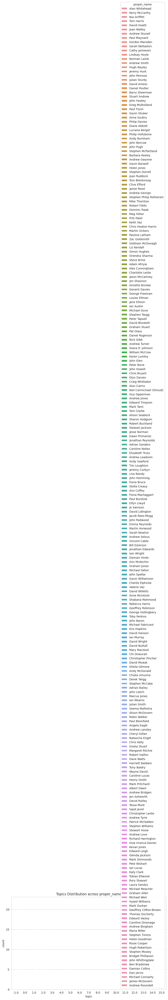

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



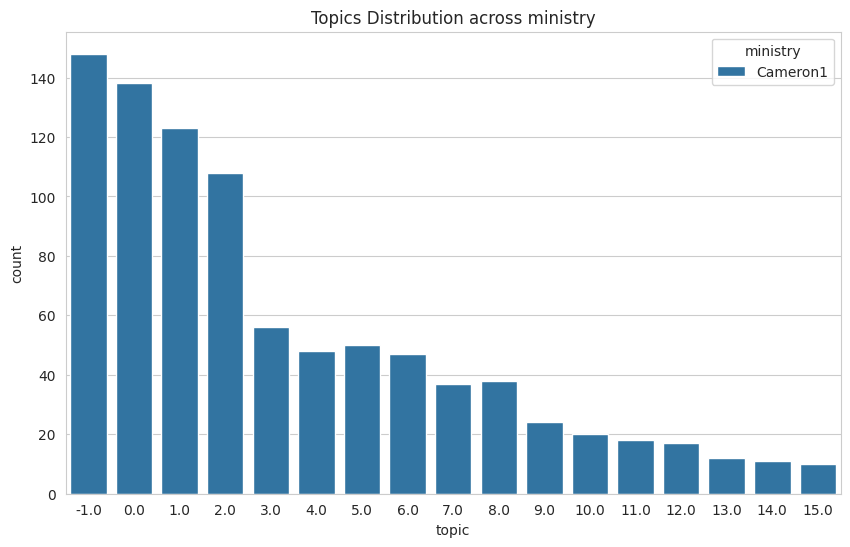

In [65]:
# Dynamic Topic Modeling (LDA) with scikit-learn
lda_model, vectorizer, tfidf = dynamic_topic_modeling_sklearn(sample, num_topics=10)
visualize_lda_wordclouds(lda_model, vectorizer)  # Visualize topics with word clouds

# BERTopic time-based analysis
bertopic_model = bertopic_time_analysis(sample)

# Analyze and visualize topics distribution across different political parties, speakers, ministries
analyze_topic_distribution(bertopic_model, sample, 'party_group')
analyze_topic_distribution(bertopic_model, sample, 'proper_name')
analyze_topic_distribution(bertopic_model, sample, 'ministry')

Topic 1:


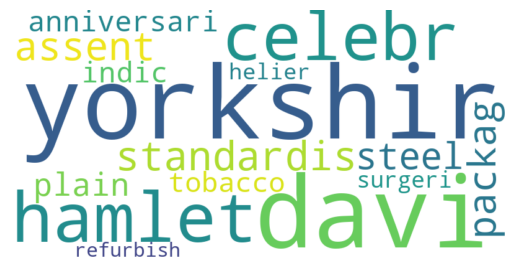

Topic 2:


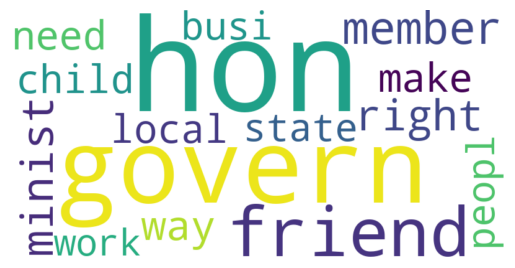

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



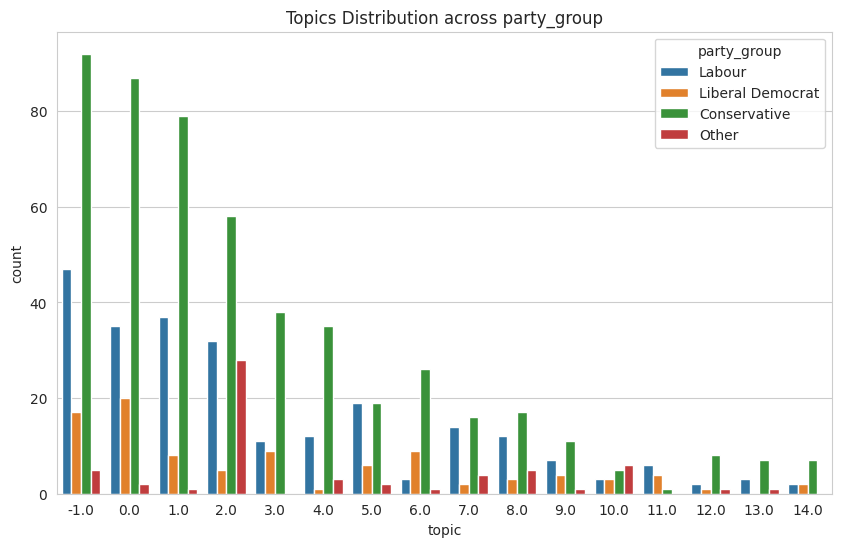

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



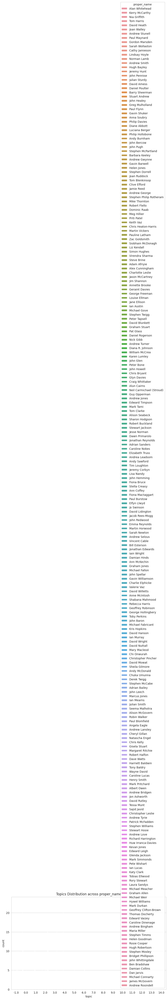

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



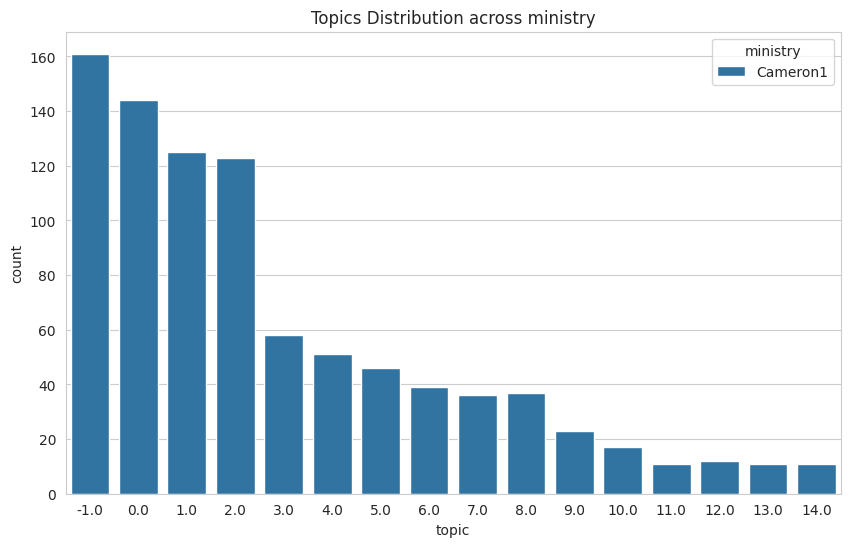

   Count Entity_Text Entity_Label
0    243       House          ORG
1    232        Iraq          GPE
2    131      Friend          ORG
3    126          UK          GPE
4    126         one     CARDINAL
co_occurrence_network.html
                                                  (two-month, DATE)  \
party_group  ministry gender sentiment_category                       
Conservative Cameron1 Female Moderately Negative                1.0   
                             Moderately Positive                NaN   
                             Neutral                            NaN   
                             Strongly Positive                  NaN   
                      Male   Moderately Negative                NaN   

                                                  (GP, ORG)  (first, ORDINAL)  \
party_group  ministry gender sentiment_category                                 
Conservative Cameron1 Female Moderately Negative        2.0               1.0   
                            

/opt/conda/lib/python3.10/site-packages/pandas/core/algorithms.py:1743: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/opt/conda/lib/python3.10/site-packages/pandas/core/algorithms.py:1743: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/opt/conda/lib/python3.10/site-packages/pandas/core/algorithms.py:1743: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/opt/conda/lib/python3.10/site-packages/pandas/core/algorithms.py:1743: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/opt/conda/lib/python3.10/site-packages/pandas/core/algorithms.py:1743: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Ch

Text Features Only - Accuracy:  0.6649214659685864
                     precision    recall  f1-score   support

Moderately Negative       0.00      0.00      0.00        20
Moderately Positive       0.89      0.16      0.27        51
            Neutral       0.65      0.99      0.79       120

           accuracy                           0.66       191
          macro avg       0.51      0.38      0.35       191
       weighted avg       0.65      0.66      0.57       191



/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.



Combined Features - Accuracy:  0.6544502617801047
                     precision    recall  f1-score   support

Moderately Negative       0.00      0.00      0.00        20
Moderately Positive       0.65      0.22      0.32        51
            Neutral       0.66      0.95      0.78       120

           accuracy                           0.65       191
          macro avg       0.43      0.39      0.37       191
       weighted avg       0.58      0.65      0.57       191



/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: DeprecationWarning:

is_sparse is deprecated and will be removed in a future versio

In [66]:
# Assuming 'sample' is defined in your context
# e.g., sample = pd.read_csv('path_to_your_data.csv')
# Dynamic Topic Modeling (LDA) with scikit-learn
lda_model, vectorizer, tfidf = dynamic_topic_modeling_sklearn(sample, num_topics=2)
visualize_lda_wordclouds(lda_model, vectorizer)

# BERTopic time-based analysis
bertopic_model = bertopic_time_analysis(sample)

# Analyze and visualize topics distribution across different political parties, speakers, ministries
analyze_topic_distribution(bertopic_model, sample, 'party_group')
analyze_topic_distribution(bertopic_model, sample, 'proper_name')
analyze_topic_distribution(bertopic_model, sample, 'ministry')

# Named Entity Recognition (NER) Analysis
run_ner_analysis(sample)
    
# Emotion Prediction
run_emotion_prediction(sample)

In [67]:
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# Bin the continuous sentiment scores into categories
# Define bins: negative (< -0.1), neutral ([-0.1, 0.1]), positive (> 0.1)

bins = [-3, -1.8, -0.6, 0.6, 1.8, 3]
labels = ['Strongly Negative', 'Moderately Negative', 'Neutral', 'Moderately Positive', 'Strongly Positive']
    
# bins = [-np.inf, -0.1, 0.1, np.inf]
# labels = ['negative', 'neutral', 'positive']
sample['average_sentiment_label'] = pd.cut(sample['average_sentiment'], bins=bins, labels=labels) # average_sentiment: afinn_sentiment

# Check the unique values to confirm the binning
print("\nUnique values in afinn_sentiment after conversion:")
print(sample['average_sentiment_label'].unique())
sample.iloc[0]


Unique values in afinn_sentiment after conversion:
['Neutral', 'Moderately Positive', 'Moderately Negative', 'Strongly Positive']
Categories (5, object): ['Strongly Negative' < 'Moderately Negative' < 'Neutral' < 'Moderately Positive' < 'Strongly Positive']


pp_id                               uk.org.publicwhip/debate/2013-06-06b.1756.2
eo_id                                                                   2000035
speech                        c("It true say little discussed Chamber disput...
afinn_sentiment                                                       -0.265684
afinn_sd                                                               3.219439
jockers_sentiment                                                      0.059695
jockers_sd                                                             0.309071
nrc_sentiment                                                          0.080234
nrc_sd                                                                 0.669475
huliu_sentiment                                                       -0.060833
huliu_sd                                                               0.688664
rheault_sentiment                                                      0.210271
rheault_sd                              

In [68]:

# Convert tokenized text back to strings for TF-IDF vectorization
sample['speech_processed_text'] = sample['speech_processed'].apply(lambda tokens: ' '.join(tokens))

# Traditional TF-IDF and Logistic Regression
vectorizer = TfidfVectorizer(max_df=0.95, min_df=2)
X_tfidf = vectorizer.fit_transform(sample['speech_processed_text'])
y = sample['average_sentiment_label']

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_tfidf, y, test_size=0.2, random_state=42)

# Logistic Regression Model
logreg = LogisticRegression()
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_test)

# Evaluation
print("Logistic Regression with TF-IDF")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Classification Report:\n", classification_report(y_test, y_pred))

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.



Logistic Regression with TF-IDF
Accuracy: 0.643979057591623
Classification Report:
                      precision    recall  f1-score   support

Moderately Negative       0.00      0.00      0.00        20
Moderately Positive       0.62      0.16      0.25        51
            Neutral       0.65      0.96      0.77       120

           accuracy                           0.64       191
          macro avg       0.42      0.37      0.34       191
       weighted avg       0.57      0.64      0.55       191



/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: DeprecationWarning:

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: DeprecationWarning:

is_sparse is deprecated and will be removed in a future versio

In [69]:
# Evaluate RoBERTa
evaluate_transformer_model('cardiffnlp/twitter-roberta-base-sentiment', sample)

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

config.json:   0%|          | 0.00/747 [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

special_tokens_map.json:   0%|          | 0.00/150 [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

pytorch_model.bin:   0%|          | 0.00/499M [00:00<?, ?B/s]

Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.


Evaluation for cardiffnlp/twitter-roberta-base-sentiment
Accuracy: 0.1207983193277311
Classification Report:
                      precision    recall  f1-score   support

Moderately Negative       0.00      0.00      0.00         6
Moderately Positive       0.01      0.89      0.02         9
            Neutral       0.98      0.11      0.20       937

           accuracy                           0.12       952
          macro avg       0.33      0.33      0.07       952
       weighted avg       0.97      0.12      0.20       952



In [70]:
# Evaluate DistilBERT
evaluate_transformer_model('distilbert-base-uncased-finetuned-sst-2-english', sample)

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

config.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.

/opt/conda/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning:

The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm im

model.safetensors:   0%|          | 0.00/268M [00:00<?, ?B/s]

Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.


Evaluation for distilbert-base-uncased-finetuned-sst-2-english
Accuracy: 0.9348739495798319
Classification Report:
                      precision    recall  f1-score   support

Moderately Negative       0.00      0.00      0.00         6
Moderately Positive       0.02      0.11      0.04         9
            Neutral       0.98      0.95      0.97       937

           accuracy                           0.93       952
          macro avg       0.34      0.35      0.33       952
       weighted avg       0.97      0.93      0.95       952








11. Named Entity Recognition (NER) for Speaker and Content Analysis: Apply Named Entity Recognition (NER) to the speech text to identify and categorize key entities such as persons, organizations, locations, dates, and policy-related terms. The goal is to understand how specific entities are referenced across different speeches and how they relate to the sentiment expressed.
- (a) Identify the most frequently mentioned entities and analyze how often certain entities (e.g., key political figures, organizations, or policy terms) appear in positive or negative contexts.
- (b) Examine co-occurrence patterns between entities to detect associations (e.g., politicians frequently mentioned alongside specific policies or issues). Visualize these associations using network graphs to reveal relationships and alliances within the discourse.
- (c) Cross-Feature Analysis: Explore how named entities are distributed across different features such as party_group, ministry and gender and analyze whether certain entities are predominantly mentioned by specific parties or ministries and how these mentions correlate with sentiment trends.
12. Emotion Prediction Using Extracted Features:
- (a) Demographic Features Only: Design a machine learning model to predict the average sentiment score of each speech based only on demographic features (e.g., gender, party_group, age). Categorize the sentiment into bins (e.g., Strongly Negative, Moderately Negative, Neutral, Moderately Positive, Strongly Positive). Apply traditional and deep learning-based models and compare the results.
- (b) Text Features Only: Convert the speech text into numerical representations suitable for machine learning models using word embeddings like Word2Vec, GloVe, or BERT. Build an emotion classification model to predict the sentiment based on the extracted features and sentiment scores.
- (c) Combined Features: Use both demographic features and speech text for sentiment prediction. Compare the results of different approaches and discuss the insights.
13. Advanced NLP and LLM Techniques for Enhanced Sentiment Analysis: Explore additional NLP techniques or state-of-the-art models to improve sentiment analysis. Experiment with transformer-based models such as RoBERTa, GPT, or DistilBERT, and compare their performance to traditional word embeddings. Assess how well these models handle nuanced expressions, such as sarcasm, subtlety, and complex emotional cues within parliamentary speeches.
14. Literature Review and Analysis:Identify relevant literature to contextualize the findings from the previous tasks. Compare various feature extraction and classification techniques, highlighting their strengths and weaknesses. Discuss the effectiveness of the data processing pipeline, suggest improvements, and explore additional data sources that could enhance sentiment and topic analysis. Address limitations, such as data imbalance or the complexity of political language and propose future research directions.